In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import re
import plotly.express as px 
import plotly.graph_objects as go 
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import folium
from statsmodels.stats.proportion import proportions_ztest

# CRIME IN BOSTON ANALYSIS
by Beami Mbani Wibawa

# LATAR BELAKANG
Berdasarkan [washingtonpost](https://www.washingtonpost.com/outlook/we-dont-know-why-violent-crime-is-up-but-we-know-theres-more-than-one-cause/2021/07/09/467dd25c-df9a-11eb-ae31-6b7c5c34f0d6_story.html), tingkat pembunuhan di AS meningkat, meskipun lambat dan tanpa banyak perhatian media, sebelum pandemi. Dari tahun 2019 hingga 2020, angka tersebut meningkat sebesar 13 persen. Maka Boston Police Departement (BPD) ingin meningkatkan pelayanannya dalam menindaklanjuti kriminalitas di Boston agar masyarakat merasa aman dan nyaman. Untuk mencapai hal tersebut, saya akan melakukan analisis berdasarkan data historikal dari dokumentasi laporan insiden kriminal yang disediakan oleh Boston Police Department yang terjadi di tahun 2015-2018. Dengan adanya analisis data historikal ini diharapkan dapat memberikan insight yang nantinya dapat dijadikan rekomendasi dalam menentukan perlengkapan dan tindakan yang akan diambil oleh BPD untuk meningkatkan pelayanan dalam menjaga keamanan.

# DATASET
- Sumber : [Crime in Boston](https://drive.google.com/drive/folders/1uPzXi8Qkf_lSxs7UbTAANxZwGe2PzREm). Terdapat 2 dataset yang harus di analisis dan diolah.
- 1 dataset akan diberi variabel crime 
- 1 dataset lainnya akan diberi variabel codes

Dataset crime berisikan dokumentasi mengenai laporan insiden kriminal yang disediakan oleh Departemen Kepolisian Boston (BPD), dengan rincian awal berupa insiden yang ditanggapi oleh petugas BPD dari laporan masyarakat sipil, yang mencakup kumpulan pelanggaran yang dilaporkan dari tanggal 15 Juni 2015-3 September 2018. Dapat dilihat bahwa pada tahun 2015 dan 2018 datanya tidak penuh. tahun 2015 hanya dimulai pada bulan juni (7 bulan) dan 2018 (hanya 9 bulan)

# TUJUAN
- Meningkatkan pelayanan patroli di Boston berdasarkan banyaknya jenis pelanggaran
- Menentukan perlengkapan dan tindakan yang dapat diambil dan dipersiapkan oleh Boston Police Departement berdasarkan banyaknya jenis pelanggaran

# RUMUSAN MASALAH
- Offense group apa yang paling sering terjadi? dan sering terjadinya di district mana?
- Apa UCR part yang paling sering terjadi di berbagai district?
- Apa jenis insiden kriminal berdasarkan UCR part yang paling sering terjadi?
- Berapa persen perbandingan antara kasus insiden kriminal dengan adanya penembakan dan tidak ada penembakan?
- Bagaimana perubahan trend kriminalitas dari waktu ke waktu?

# EXPLORING DATA 

## Load Dataset Crime

Dataset crime menjelaskan mengenai rincian laporan insiden kejahatan di Boston.

In [2]:
# Untuk membuka file csv dari dataset bernama crime disimpan dalam variabel crime
crime = pd.read_csv('crime.csv',encoding='latin1')

In [3]:
# cek dataset crime
def check(crime_table):
    print('')
    print('******* CEK JUMLAH TOTAL BARIS & KOLOM *******')
    print(crime_table.shape)
    print('')
    print('')
    print('******* CEK TIPE-TIPE DATA, DATA TERISI, MEMORY USAGE *******')
    print(crime_table.info())
    print('')
    print('')
    print('******* CEK DATA 5 TERATAS *******')
    print(crime_table.head())
    print('')
    print('')
    print('******* CEK DATA 5 TERBAWAH *******')
    print(crime_table.tail())

check(crime)


******* CEK JUMLAH TOTAL BARIS & KOLOM *******
(319073, 17)


******* CEK TIPE-TIPE DATA, DATA TERISI, MEMORY USAGE *******
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319073 entries, 0 to 319072
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   INCIDENT_NUMBER      319073 non-null  object 
 1   OFFENSE_CODE         319073 non-null  int64  
 2   OFFENSE_CODE_GROUP   319073 non-null  object 
 3   OFFENSE_DESCRIPTION  319073 non-null  object 
 4   DISTRICT             317308 non-null  object 
 5   REPORTING_AREA       319073 non-null  object 
 6   SHOOTING             1019 non-null    object 
 7   OCCURRED_ON_DATE     319073 non-null  object 
 8   YEAR                 319073 non-null  int64  
 9   MONTH                319073 non-null  int64  
 10  DAY_OF_WEEK          319073 non-null  object 
 11  HOUR                 319073 non-null  int64  
 12  UCR_PART             318983 non-null  object 

## Penjelasan kolom pada dataset crime
| kolom | Penjelasan |
| --- | --- |
| INCIDENT_NUMBER | berisikan number insiden kriminal yang dilaporkan oleh masyarakat sipil kepada Boston Police Department (BPD) |
| OFFENSE_CODE | kode-kode pelanggaran berupa angka |
| OFFENSE_CODE_GROUP | berisikan grup-grup pelanggaran dari [UCR_PART] |
| OFFENSE_DESCRIPTION | berisikan nama pelanggaran berdasarkan kode angka [OFFENSE_CODE] |
| DISTRICT | berisikan daerah terjadinya insiden kriminal |
| REPORTING_AREA | berisikan tentang area pelaporan, darimana insiden kriminal itu dilaporkan |
| SHOOTING | berisikan indikasi terjadinya penembakan |
| OCCURRED_ON_DATE | berisikan tanggal dan waktu paling awal insiden kriminal itu bisa terjadi |
| YEAR | berisikan tahun berasal dari [OCCURRED_ON_DATE] |
| MONTH | berisikan bulan berasal dari [OCCURRED_ON_DATE] |
| DAY_OF_WEEK | berisikan hari berasal dari [OCCURRED_ON_DATE] |
| HOUR | berisikan jam berasal dari [OCCURRED_ON_DATE] |
| UCR_PART | berisikan Nomor Bagian Pelaporan Kejahatan Universal (1,2,3) berdasarkan [Group] |
| | UCR (Uniform Crime Report) adalah laporan tahunan yang dikeluarkan oleh FBI yang menyajikan data tentang kategori kejahatan tertentu yang dilaporkan ke polisi (dictionary.com) |
| | Terdapat 2 part dari UCR berdasarkan [sumber](https://www.cityofroseville.com/DocumentCenter/View/26568/Description-of-Uniform-Crime-Offenses):
| | Part I (Kejahatan Berat) = Criminal Homicide - The killing of another person (Murder and Nonnegligent Manslaughter & Manslaughter), Rape, Robbery (Armed Robbery-Any Weapon & Strong    Arm-No Weapon), Aggravated Assault (Gun, Knife or Cutting Instrument, Other Dangerous Weapons, Hands, Fists, Feet, etc. Aggravated), Burglary (Forcible Entry, Unlawful Entry-No Force, Attempted Forcible Entry), Larceny , Motor Vehicle Theft , Arson, Human Trafficking - Commercial Sex Acts, Human Trafficking - Involuntary Servitude |
| | Part II (Kejahatan Ringan)  = Other Assaults, Forgery and Counterfeiting , Fraud, Embezzlement, Stolen Property, Vandalism, Weapons, Prostitution and Commercialized Vice , Sex Offenses , Drug Abuse Violation, Gambling , Offenses Against Family and Children, Driving Under the Influence , Liquor Laws, Disorderly Conduct, Vagrancy , All Other Offenses (All violations of state or local laws not specifically identified as Part I or Part II offenses,except traffic violations. This classification includes: • Admitting minors to improper places • Bigamy and polygamy • Blackmail and extortion • Contempt of court • Kidnapping • Possession of drug paraphernalia • Riot and rout, etc. • Attempts to commit any of the above), Curfew and Loitering Law Violation (Juvenile), Runaways (Juvenile) |
| | Part III = menurut [sumber](https://www.cityofroseville.com/DocumentCenter/View/26568/Description-of-Uniform-Crime-Offenses), terdapat pernyataan bahwa "All Other Offenses (All violations of state or local laws not specifically identified as Part I or Part II offenses,except traffic violations". |
| STREET | berisikan nama jalan tempat insiden kriminal itu terjadi |
| Lat | berisikan latitude dalam peta berasal dari [Street] |
| Long | berisikan longitude dalam peta berasal dari [Street] |
| Location | berisikan gabungan [Latitude] dan [Longitude] berasal dari [Street] |

In [4]:
# Cek dan hapus data duplikat dari dataset crime
print(crime.shape, crime.drop_duplicates().shape)
crime = crime.drop_duplicates()

(319073, 17) (319050, 17)


## Load Dataset Codes

Dataset codes menjelaskan mengenai kode-kode pelanggaran.

In [5]:
# Untuk membuka file csv dari dataset bernama offense_codes disimpan dalam variabel codes
codes = pd.read_csv('offense_codes.csv', encoding='latin1')

In [6]:
# cek dataset codes
def check(codes_table):
    print('')
    print('******* CEK JUMLAH TOTAL BARIS & KOLOM *******')
    print(codes_table.shape)
    print('')
    print('')
    print('******* CEK TIPE-TIPE DATA, DATA TERISI, MEMORY USAGE *******')
    print(codes_table.info())
    print('')
    print('')
    print('******* CEK DATA 5 TERATAS *******')
    print(codes_table.head())
    print('')
    print('')
    print('******* CEK DATA 5 TERBAWAH *******')
    print(codes_table.tail())

check(codes)


******* CEK JUMLAH TOTAL BARIS & KOLOM *******
(576, 2)


******* CEK TIPE-TIPE DATA, DATA TERISI, MEMORY USAGE *******
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 576 entries, 0 to 575
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   CODE    576 non-null    int64 
 1   NAME    576 non-null    object
dtypes: int64(1), object(1)
memory usage: 9.1+ KB
None


******* CEK DATA 5 TERATAS *******
   CODE                                     NAME
0   612         LARCENY PURSE SNATCH - NO FORCE 
1   613                      LARCENY SHOPLIFTING
2   615  LARCENY THEFT OF MV PARTS & ACCESSORIES
3  1731                                   INCEST
4  3111                LICENSE PREMISE VIOLATION


******* CEK DATA 5 TERBAWAH *******
     CODE                                       NAME
571  1806  DRUGS - CLASS B TRAFFICKING OVER 18 GRAMS
572  1807  DRUGS - CLASS D TRAFFICKING OVER 50 GRAMS
573  1610    HUMAN TRAFFICKING - COMMERCIAL SEX 

## Penjelasan Kolom Dataset Codes
| Kolom | Penjelasan |
| --- | --- |
| CODE | kode-kode pelanggaran berupa angka (sama seperti kolom OFFENSE_CODE di dataset crime.csv) |
| NAME | Deskripsi pelanggaran |

Karena isi dari kolom CODE pada dataset codes sama dengan isi dari kolom OFFENSE_CODE di dataset crime. Maka saya akan mengganti nama kolom CODE menjadi OFFENSE_CODE pada dataset codes

In [7]:
# Mengganti nama kolom CODE menjadi OFFENSE_CODE pada dataframe codes
codes = codes.rename(columns={'CODE': 'OFFENSE_CODE'})

In [8]:
# Cek dan hapus data duplikat dari dataset codes
print(codes.shape, codes.drop_duplicates().shape)
codes = codes.drop_duplicates()

(576, 2) (493, 2)


In [9]:
# Mengecek unique value dari kolom NAME
codes['NAME'].unique()

array(['LARCENY PURSE SNATCH - NO FORCE ', 'LARCENY SHOPLIFTING',
       'LARCENY THEFT OF MV PARTS & ACCESSORIES', 'INCEST',
       'LICENSE PREMISE VIOLATION', 'LIQUOR - DRINKING IN PUBLIC',
       'LIQUOR LAW VIOLATION',
       'M/V ACCIDENT - INVOLVING ÊBICYCLE - INJURY',
       'M/V ACCIDENT - OTHER', 'M/V ACCIDENT - OTHER CITY VEHICLE',
       'M/V ACCIDENT - PERSONAL INJURY', 'M/V ACCIDENT - POLICE VEHICLE',
       'M/V ACCIDENT - PROPERTY ÊDAMAGE', 'M/V PLATES - LOST',
       'MANSLAUGHTER - NON-VEHICLE - NEGLIGENCE',
       'MANSLAUGHTER - VEHICLE - NEGLIGENCE', 'MISSING PERSON',
       'MISSING PERSON - LOCATED',
       'MISSING PERSON - NOT REPORTED - LOCATED',
       'MURDER, NON-NEGLIGIENT MANSLAUGHTER', 'NOISY PARTY/RADIO-ARREST',
       'OBSCENE MATERIALS - PORNOGRAPHY', 'OBSCENE PHONE CALLS',
       'OPEN & GROSS LEWDNESS', 'VIOL. OF RESTRAINING ORDER W NO ARREST',
       'OPERATING UNDER THE INFLUENCE DRUGS', 'OTHER OFFENSE',
       'VAL - VIOLATION OF AUTO LAW - OTHER

## Merge Dataset Crime dan Codes 

In [10]:
# Menggabungkan dua dataset crime dan codes
df=pd.merge(crime,codes,on='OFFENSE_CODE',how='left').sort_values('OFFENSE_CODE')
df.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,NAME
358823,I152096420,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",E13,578,Y,2015-11-20 17:58:00,2015,11,Friday,17,Part One,CENTRE ST,42.322463,-71.107579,"(42.32246336, -71.10757917)",MURDER NON-NEGLIGIENT MANSLAUGHTER
92466,I172102399,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",A7,35,Y,2017-12-10 16:41:00,2017,12,Sunday,16,Part One,MARGINAL ST,42.366720,-71.039087,"(42.36671964, -71.03908712)","MURDER, NON-NEGLIGIENT MANSLAUGHTER"
287520,I162047273,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",A7,23,NaN,2016-06-15 08:34:00,2016,6,Wednesday,8,Part One,PRINCETON ST,42.376796,-71.037897,"(42.37679597, -71.03789722)",MURDER NON-NEGLIGIENT MANSLAUGHTER
287519,I162047273,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",A7,23,NaN,2016-06-15 08:34:00,2016,6,Wednesday,8,Part One,PRINCETON ST,42.376796,-71.037897,"(42.37679597, -71.03789722)","MURDER, NON-NEGLIGIENT MANSLAUGHTER"
92467,I172102399,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",A7,35,Y,2017-12-10 16:41:00,2017,12,Sunday,16,Part One,MARGINAL ST,42.366720,-71.039087,"(42.36671964, -71.03908712)",MURDER NON-NEGLIGIENT MANSLAUGHTER


In [11]:
# Cek kolom 'Name' dan 'OFFENSE_DESCRIPTION' apakah sama/berbeda
pd.crosstab(index=[df['NAME'],df['OFFENSE_DESCRIPTION']],columns='Jumlah')

,col_0,Jumlah
NAME,OFFENSE_DESCRIPTION,
"A&B HANDS, FEET, ETC. - MED. ATTENTION REQ.","A&B HANDS, FEET, ETC. - MED. ATTENTION REQ.",1
A&B ON POLICE OFFICER,A&B ON POLICE OFFICER,3
ABDUCTION - INTICING,ABDUCTION - INTICING,12
AFFRAY,AFFRAY,249
AIRCRAFT INCIDENTS,AIRCRAFT INCIDENTS,36
...,...,...
WEAPON - FIREARM - OTHER VIOLATION,WEAPON - FIREARM - OTHER VIOLATION,238
WEAPON - FIREARM - SALE / TRAFFICKING,WEAPON - FIREARM - SALE / TRAFFICKING,13
"WEAPON - OTHER - CARRYING / POSSESSING, ETC",FIREARM/WEAPON - POSSESSION OF DANGEROUS,3


Kolom NAME dan OFFENSE_DESCRIPTION berisikan penjelasan yang sama. Maka kolom NAME dihapus

In [12]:
df.drop('NAME',axis=1,inplace=True)

Mengganti nama-nama kolom agar rapi

In [13]:
# Mengganti nama-nama kolom
rename_columns = {
              'INCIDENT_NUMBER':'Incident Number',
              'OFFENSE_CODE':'Offense Code',
              'OFFENSE_CODE_GROUP':'Group',
              'OFFENSE_DESCRIPTION':'Description',
              'DISTRICT':'District',
              'REPORTING_AREA':'Area',
              'SHOOTING':'Shooting',
              'OCCURRED_ON_DATE':'Date',
              'YEAR':'Year',
              'MONTH':'Month',
              'DAY_OF_WEEK':'Day',
              'HOUR':'Hour',
              'UCR_PART': 'UCR Part',
              'STREET':'Street',
              'Lat':'Latitude',
              'Long':'Longitude'
              }
df.rename(index=str, columns=rename_columns, inplace=True)

df.head()

,Incident Number,Offense Code,Group,Description,District,Area,Shooting,Date,Year,Month,Day,Hour,UCR Part,Street,Latitude,Longitude,Location
358823,I152096420,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",E13,578,Y,2015-11-20 17:58:00,2015,11,Friday,17,Part One,CENTRE ST,42.322463,-71.107579,"(42.32246336, -71.10757917)"
92466,I172102399,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",A7,35,Y,2017-12-10 16:41:00,2017,12,Sunday,16,Part One,MARGINAL ST,42.366720,-71.039087,"(42.36671964, -71.03908712)"
287520,I162047273,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",A7,23,NaN,2016-06-15 08:34:00,2016,6,Wednesday,8,Part One,PRINCETON ST,42.376796,-71.037897,"(42.37679597, -71.03789722)"
287519,I162047273,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",A7,23,NaN,2016-06-15 08:34:00,2016,6,Wednesday,8,Part One,PRINCETON ST,42.376796,-71.037897,"(42.37679597, -71.03789722)"
92467,I172102399,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",A7,35,Y,2017-12-10 16:41:00,2017,12,Sunday,16,Part One,MARGINAL ST,42.366720,-71.039087,"(42.36671964, -71.03908712)"


## Penjelasan kolom pada dataset yang telah di merge 
| Kolom | Penjelasan |
| --- | --- | 
| Incident Number | berisikan number insiden kriminal yang dilaporkan oleh masyarakat sipil kepada Boston Police Department (BPD) |
| Offense Code | kode-kode pelanggaran berupa angka |
| Group | berisikan grup-grup pelanggaran dari [UCR Part] |
| Description | berisikan nama pelanggaran berdasarkan kode angka [Offense Code] |
| District | berisikan daerah terjadinya insiden kriminal |
| Area | berisikan tentang area pelaporan, darimana insiden kriminal itu dilaporkan |
| Shooting | berisikan indikasi terjadinya penembakan |
| Date | berisikan tanggal dan waktu paling awal insiden kriminal itu bisa terjadi |
| Year | berisikan tahun berasal dari [Date] |
| Month | berisikan bulan berasal dari [Date] |
| Day | berisikan hari berasal dari [Date] |
| Hour | berisikan jam berasal dari [Date] |
| UCR Part | berisikan Nomor Bagian Pelaporan Kejahatan Universal (1,2,3) berdasarkan [Group] |
| | UCR (Uniform Crime Report) adalah laporan tahunan yang dikeluarkan oleh FBI yang menyajikan data tentang kategori kejahatan tertentu yang dilaporkan ke polisi (dictionary.com) |
| | Terdapat 2 part dari UCR menurut [sumber](https://www.cityofroseville.com/DocumentCenter/View/26568/Description-of-Uniform-Crime-Offenses): |
| | Part I (Kejahatan Berat) = Criminal Homicide - The killing of another person (Murder and Nonnegligent Manslaughter & Manslaughter), Rape, Robbery (Armed Robbery-Any Weapon & Strong    Arm-No Weapon), Aggravated Assault (Gun, Knife or Cutting Instrument, Other Dangerous Weapons, Hands, Fists, Feet, etc. Aggravated), Burglary (Forcible Entry, Unlawful Entry-No Force, Attempted Forcible Entry), Larceny , Motor Vehicle Theft , Arson, Human Trafficking - Commercial Sex Acts, Human Trafficking - Involuntary Servitude |
| | Part II (Kejahatan Ringan)  = Other Assaults, Forgery and Counterfeiting , Fraud, Embezzlement, Stolen Property, Vandalism, Weapons, Prostitution and Commercialized Vice , Sex Offenses , Drug Abuse Violation, Gambling , Offenses Against Family and Children, Driving Under the Influence , Liquor Laws, Disorderly Conduct, Vagrancy , All Other Offenses (All violations of state or local laws not specifically identified as Part I or Part II offenses,except traffic violations. This classification includes: • Admitting minors to improper places • Bigamy and polygamy • Blackmail and extortion • Contempt of court • Kidnapping • Possession of drug paraphernalia • Riot and rout, etc. • Attempts to commit any of the above), Curfew and Loitering Law Violation (Juvenile), Runaways (Juvenile) |
| | Part III = menurut [sumber](https://www.cityofroseville.com/DocumentCenter/View/26568/Description-of-Uniform-Crime-Offenses) , terdapat pernyataan bahwa "All Other Offenses (All violations of state or local laws not specifically identified as Part I or Part II offenses,except traffic violations". |
| Street | berisikan nama jalan tempat insiden kriminal itu terjadi |
| Latitude | berisikan latitude dalam peta berasal dari [Street] |
| Longitude | berisikan longitude dalam peta berasal dari [Street] |
| Location | berisikan gabungan [Latitude] dan [Longitude] berasal dari [Street] |

In [14]:
# cek dataset merge
def check(crime_table):
    print('')
    print('******* CEK JUMLAH TOTAL BARIS & KOLOM *******')
    print(crime_table.shape)
    print('')
    print('')
    print('******* CEK TIPE-TIPE DATA, DATA TERISI, MEMORY USAGE *******')
    print(crime_table.info())
    print('')
    print('')
    print('******* CEK DATA 5 TERATAS *******')
    print(crime_table.head())
    print('')
    print('')
    print('******* CEK DATA 5 TERBAWAH *******')
    print(crime_table.tail())

check(df)


******* CEK JUMLAH TOTAL BARIS & KOLOM *******
(416225, 17)


******* CEK TIPE-TIPE DATA, DATA TERISI, MEMORY USAGE *******
<class 'pandas.core.frame.DataFrame'>
Index: 416225 entries, 358823 to 293631
Data columns (total 17 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   Incident Number  416225 non-null  object 
 1   Offense Code     416225 non-null  int64  
 2   Group            416225 non-null  object 
 3   Description      416225 non-null  object 
 4   District         413984 non-null  object 
 5   Area             416225 non-null  object 
 6   Shooting         1759 non-null    object 
 7   Date             416225 non-null  object 
 8   Year             416225 non-null  int64  
 9   Month            416225 non-null  int64  
 10  Day              416225 non-null  object 
 11  Hour             416225 non-null  int64  
 12  UCR Part         416135 non-null  object 
 13  Street           402509 non-null  object 
 14  Latitud

# DATA CLEANING

In [15]:
# Mengecek unique value dari tiap kolom
pd.set_option('display.max_colwidth', None)
# data unik di tiap kolom
listItem = []
for col in df.columns :
    listItem.append( [col, df[col].nunique(), df.sort_values(col)[col].unique()])

dfunik = pd.DataFrame(columns=['Nama kolom', 'Jumlah unique value', 'Unique value'],
                     data=listItem)
dfunik

,Nama kolom,Jumlah unique value,Unique value
0,Incident Number,282517,"[142052550, I010370257-00, I030217815-08, I050310906-00, I060168073-00, I080542626-00, I090317057-00, I090321958-00, I100033064-00, I100222105-02, I100340225-00, I100636670-00, I110177502-00, I110261417-00, I110372326-00, I110551302-00, I110611058-00, I110694557-00, I120069826-00, I120189428-00, I120201612-00, I120260724-01, I120283195-00, I120470733-00, I120595668-00, I120719309-00, I120720047-00, I130007264-01, I130031413-00, I130041200-00, I130084703-00, I130126035-00, I130194606-00, I130202615-00, I130204032-00, I130304171-00, I130325877-00, I130371627-00, I130452692-00, I130513834-00, I130559249-00, I130626822-00, I130634867-00, I130731947-00, I130739503-00, I130769339-00, I130789976-00, I140036361-00, I140039570-00, I140041532-00, I140042060-00, I140056633-00, I140110321-00, I140148421-00, I140160427-01, I140173500-00, I140188130-00, I140254285-00, I140295154-00, I140300475-02, I140311903-00, I140319608-00, I140346143-00, I140356025-00, I140372066-00, I142002101-00, I142004681-00, I142010194-00, I142013220-00, I142014620-00, I142016089-00, I142017108-00, I142020701-00, I142020933-00, I142022633-00, I142023661-00, I142024796-00, I142025834-00, I142025900-00, I142029747-00, I142032469-00, I142033071-00, I142033219-00, I142034820-00, I142035471-00, I142036405-00, I142039468-00, I142041046-00, I142041685-01, I142042232-00, I142044610-00, I142045442-00, I142045856-00, I142045979-00, I142048539-00, I142049917-00, I142050174-00, I142050207-00, I142051855-00, I142052022-00, ...]"
1,Offense Code,222,"[111, 112, 121, 123, 301, 311, 315, 334, 335, 338, 339, 349, 351, 361, 371, 381, 402, 403, 404, 413, 423, 432, 511, 520, 521, 522, 527, 530, 540, 541, 542, 547, 560, 561, 562, 611, 612, 613, 614, 615, 616, 617, 618, 619, 623, 624, 627, 629, 633, 634, 637, 639, 670, 706, 714, 724, 727, 735, 770, 801, 802, 803, 804, 900, 1001, 1002, 1102, 1105, 1106, 1107, 1108, 1109, 1201, 1300, 1302, 1304, 1402, 1415, 1501, 1502, 1503, 1504, 1510, 1601, 1602, 1603, 1605, 1610, 1620, 1805, 1806, 1807, 1810, 1815, 1825, 1830, 1831, 1832, 1841, 1842, ...]"
2,Group,67,"[Aggravated Assault, Aircraft, Arson, Assembly or Gathering Violations, Auto Theft, Auto Theft Recovery, Ballistics, Biological Threat, Bomb Hoax, Burglary - No Property Taken, Commercial Burglary, Confidence Games, Counterfeiting, Criminal Harassment, Disorderly Conduct, Drug Violation, Embezzlement, Evading Fare, Explosives, Fire Related Reports, Firearm Discovery, Firearm Violations, Fraud, Gambling, HOME INVASION, HUMAN TRAFFICKING, HUMAN TRAFFICKING - INVOLUNTARY SERVITUDE, Harassment, Harbor Related Incidents, Homicide, INVESTIGATE PERSON, Investigate Person, Investigate Property, Landlord/Tenant Disputes, Larceny, Larceny From Motor Vehicle, License Plate Related Incidents, License Violation, Liquor Violation, Manslaughter, Medical Assistance, Missing Person Located, Missing Person Reported, Motor Vehicle Accident Response, Offenses Against Child / Family, Operating Under the Influence, Other, Other Burglary, Phone Call Complaints, Police Service Incidents, Prisoner Related Incidents, Property Found, Property Lost, Property Related Damage, Prostitution, Recovered Stolen Property, Residential Burglary, Restraining Order Violations, Robbery, Search Warrants, Service, Simple Assault, Towed, Vandalism, Verbal Disputes, Violations, Warrant Arrests]"
3,Description,244,"[A&B HANDS, FEET, ETC. - MED. ATTENTION REQ., A&B ON POLICE OFFICER, ABDUCTION - INTICING, AFFRAY, AIRCRAFT INCIDENTS, ANIMAL ABUSE, ANIMAL CONTROL - DOG BITES - ETC., ANIMAL INCIDENTS, ANNOYING AND ACCOSTIN, ANNOYING AND ACCOSTING, ARSON, ASSAULT & BATTERY, ASSAULT & BATTERY D/W - KNIFE, ASSAULT & BATTERY D/W - OTHER, ASSAULT & BATTERY D/W - OTHER ON POLICE OFFICER, ASSAULT - AGGRAVATED, ASSAULT - AGGRAVATED - BATTERY, ASSAULT - SIMPLE, ASSAULT D/W - KNIFE ON POLICE OFFICER, ASSAULT D/W - OTHER, ASSAULT SIMPLE - BATTERY, AUTO THEFT, AUTO THEFT - LEASED/

In [16]:
# cek date apakah memiliki pola 'yyyy-mm-dd hh:mm:ss'

Dates = ' '.join(list(df['Date']))
words = Dates
pattern = r'\d{4}-\d{2}-\d{2}\s\d{2}:\d{2}:\d{2}'

n_baris = len(re.findall(pattern=pattern, string=words))
print(f"Terdapat {n_baris} baris yang date-nya memiliki pola 'yyyy-mm-dd hh:mm:ss'")
print(f'Persentase sebesar {n_baris/len(df) * 100:.4f} % data')

Terdapat 416225 baris yang date-nya memiliki pola 'yyyy-mm-dd hh:mm:ss'
Persentase sebesar 100.0000 % data


Berdasarkan Pengamatan Unik Value, dapat dilihat bahwa :
- Pada INCIDENT NUMBER ada format penulisan yang berbeda dari yang lain, yaitu 142052550. Format penulisan incident number ini diawali oleh angka 1 dan dengan pola I\d{9}, sedangkan secara umum format penulisan incident number diawali oleh huruf 'I' dan mengikuti pola I\d{9}(-\d{2})
- Pada GROUP terdapat format penulisan yang berbeda, yaitu menggunakan kapital semua (HOME INVASION, HUMAN TRAFFICKING, HUMAN TRAFFICKING - INVOLUNTARY SERVITUDE, INVESTIGATE PERSON) sedangkan yang lain tidak. 

Saya akan menganalisis format penulisan incident number dan group yang tidak sesuai

## Analisis Format Penulisan Incident Number

In [17]:
# mengecek nilai pada kolom incident number yang tidak di awali 'I'

n_baris = len(df[df['Incident Number'].str.contains('I') == False])
print(f"Terdapat {n_baris} baris yang tidak diawali huruf 'I'")

Terdapat 1 baris yang tidak diawali huruf 'I'


In [18]:
# mengubah '142052550' menjadi 'I142052550'

df['Incident Number'] = df['Incident Number'].replace(['142052550'],'I142052550')
df[df['Incident Number'].str.contains('142052550')]

,Incident Number,Offense Code,Group,Description,District,Area,Shooting,Date,Year,Month,Day,Hour,UCR Part,Street,Latitude,Longitude,Location
416224,I142052550,3125,Warrant Arrests,WARRANT ARREST,D4,903,NaN,2015-06-22 00:12:00,2015,6,Monday,0,Part Three,WASHINGTON ST,42.333839,-71.08029,"(42.33383935, -71.08029038)"


In [19]:
# mengecek nilai pada kolom Incident Number yang berbentuk 'I\d{9}-\d{2}'

n_baris = len(df[df['Incident Number'].str.contains('I\d{9}-\d{2}')])
print(f"Terdapat {n_baris} baris yang memiliki pola 'I' diikuti 9 digit angka kemudian '-' dan 2 digit angka'")

Terdapat 425 baris yang memiliki pola 'I' diikuti 9 digit angka kemudian '-' dan 2 digit angka'


In [20]:
# mengambil 10 karakter pertama pada kolom Incident Number sehingga format penulisan berbentuk 'I\d{9}'

df['Incident Number'] = df['Incident Number'].apply(lambda string : string[:10])
df[df['Incident Number'].str.contains('I\d{9}')].sample(5)

,Incident Number,Offense Code,Group,Description,District,Area,Shooting,Date,Year,Month,Day,Hour,UCR Part,Street,Latitude,Longitude,Location
318253,I162022208,1106,Confidence Games,FRAUD - CREDIT CARD / ATM FRAUD,A7,30,NaN,2016-03-22 11:02:00,2016,3,Tuesday,11,Part Two,FRANKFORT ST,42.369562,-71.035448,"(42.36956222, -71.03544834)"
178165,I172031650,1842,Drug Violation,"DRUGS - POSS CLASS A - HEROIN, ETC.",B2,,NaN,2017-04-23 16:56:00,2017,4,Sunday,16,Part Two,SAINT JAMES ST,NaN,NaN,"(0.00000000, 0.00000000)"
20129,I182054174,2647,Other,THREATS TO DO BODILY HARM,B3,463,NaN,2018-07-10 11:15:01,2018,7,Tuesday,11,Part Two,HARVARD ST,42.292606,-71.089898,"(42.29260629, -71.08989828)"
67754,I182015108,802,Simple Assault,ASSAULT SIMPLE - BATTERY,A1,111,NaN,2018-02-26 16:31:00,2018,2,Monday,16,Part Two,TREMONT ST,42.355942,-71.062583,"(42.35594239, -71.06258333)"
404680,I152059021,801,Simple Assault,ASSAULT - SIMPLE,E18,488,NaN,2015-07-17 08:26:00,2015,7,Friday,8,Part Two,RIVER ST,42.263025,-71.107629,"(42.26302512, -71.10762853)"


## Analisis Format Penulisan Group

Setelah di cek ternyata pada kolom Group ada beberapa format penulisan yang berbeda namun maksud sama, seperti:
- 'Investigate Person' dan 'INVESTIGATE PERSON' maka saya akan ubah format penulisannya menjadi 'Investigate Person'
- 'HUMAN TRAFFICKING' dibagi menjadi 2 berdasarkan UCR Part yaitu 'Human Trafficking - Commercial Sex Acts' dan 'Human Trafficking - Involuntary Servitude', maka untuk 'HUMAN TRAFFICKING' akan saya ubah menjadi 'Human Trafficking - Commercial Sex Acts' dan untuk 'HUMAN TRAFFICKING - INVOLUNTARY SERVITUDE' akan saya ubah format penulisannya menjadi 'Human Trafficking - Involuntary Servitude'
- Penulisan 'HOME INVASION' menggunakan capital semua maka akan saya ubah menjadi 'Home Invasion'

In [21]:
df.replace({'Group':['INVESTIGATE PERSON',
                    'HUMAN TRAFFICKING',
                    'HUMAN TRAFFICKING - INVOLUNTARY SERVITUDE',
                    'HOME INVASION']},
           {'Group':['Investigate Person',
                    'Human Trafficking - Commercial Sex Acts',
                    'Human Trafficking - Involuntary Servitude',
                    'Home Invasion']}, 
                    inplace=True)

In [22]:
# cek deskriptif
display(df.describe(), df.describe(include='object'))

,Offense Code,Year,Month,Hour,Latitude,Longitude
count,416225.000000,416225.000000,416225.000000,416225.000000,390895.000000,390895.000000
mean,1994.027817,2016.550128,6.621765,13.135367,42.213038,-70.904605
std,1238.440275,1.000980,3.270815,6.311785,2.181011,3.527917
min,111.000000,2015.000000,1.000000,0.000000,-1.000000,-71.178674
25%,619.000000,2016.000000,4.000000,9.000000,42.298489,-71.096709
50%,1848.000000,2017.000000,7.000000,14.000000,42.326968,-71.077389
75%,3115.000000,2017.000000,9.000000,18.000000,42.348958,-71.062436
max,3831.000000,2018.000000,12.000000,23.000000,42.395042,-1.000000


,Incident Number,Group,Description,District,Area,Shooting,Date,Day,UCR Part,Street,Location
count,416225,416225,416225,413984,416225,1759,416225,416225,416135,402509,416225
unique,282517,66,244,12,879,1,233229,7,4,4657,18194
top,I172096394,Larceny,ASSAULT SIMPLE - BATTERY,B2,,Y,2016-08-01 00:00:00,Friday,Part Three,WASHINGTON ST,"(0.00000000, 0.00000000)"
freq,18,51859,29582,64380,25379,1759,39,63214,161277,19149,25330


Berdasarkan pengamatan deskriptif, dapat dilihat bahwa:
- pada Latitude dan Longitude terdapat nilai -1.000000 (termasuk outlier)
- pada kolom area terdapat blank value
- pada location terdapat nilai (0.00000000, 0.00000000) (termasuk outlier)

## Cek outlier pada latitude

<AxesSubplot:xlabel='Latitude'>

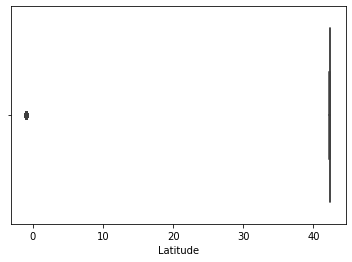

In [23]:
sns.boxplot(x=df['Latitude'])

In [24]:
df[df['Latitude']==-1.000000]

,Incident Number,Offense Code,Group,Description,District,Area,Shooting,Date,Year,Month,Day,Hour,UCR Part,Street,Latitude,Longitude,Location
218228,I162104752,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",A7,,NaN,2016-12-24 22:45:00,2016,12,Saturday,22,Part One,NaN,-1.0,-1.0,"(-1.00000000, -1.00000000)"
218229,I162104752,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",A7,,NaN,2016-12-24 22:45:00,2016,12,Saturday,22,Part One,NaN,-1.0,-1.0,"(-1.00000000, -1.00000000)"
273556,I162058828,301,Robbery,ROBBERY - STREET,NaN,,NaN,2016-07-23 18:46:00,2016,7,Saturday,18,Part One,CODMAN,-1.0,-1.0,"(-1.00000000, -1.00000000)"
273555,I162058828,301,Robbery,ROBBERY - STREET,NaN,,NaN,2016-07-23 18:46:00,2016,7,Saturday,18,Part One,CODMAN,-1.0,-1.0,"(-1.00000000, -1.00000000)"
275421,I162057230,301,Robbery,ROBBERY - STREET,NaN,,NaN,2016-07-18 14:45:00,2016,7,Monday,14,Part One,GREENWOOD,-1.0,-1.0,"(-1.00000000, -1.00000000)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86788,I172107172,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,NaN,,NaN,2017-12-24 20:30:00,2017,12,Sunday,20,Part Three,HUMBOLDT,-1.0,-1.0,"(-1.00000000, -1.00000000)"
50368,I182029532,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,NaN,,NaN,2018-04-20 13:29:00,2018,4,Friday,13,Part Three,RUGGLES,-1.0,-1.0,"(-1.00000000, -1.00000000)"
22945,I182051912,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,C6,,NaN,2018-06-28 17:20:00,2018,6,Thursday,17,Part Three,BOSTON,-1.0,-1.0,"(-1.00000000, -1.00000000)"
215521,I172000551,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,NaN,,NaN,2016-12-30 22:00:00,2016,12,Friday,22,Part Three,CRESCENT,-1.0,-1.0,"(-1.00000000, -1.00000000)"


Karena saya tidak ada domain knowledge, maka saya akan ubah -1.000000 dengan missing value

In [25]:
df['Latitude'] = df['Latitude'].replace(-1.000000, np.nan)

## Cek outlier pada longitude

<AxesSubplot:xlabel='Longitude'>

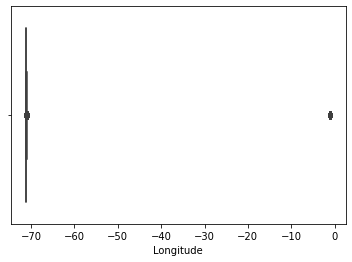

In [26]:
sns.boxplot(x=df['Longitude'])

In [27]:
df[df['Longitude']==-1.000000]

,Incident Number,Offense Code,Group,Description,District,Area,Shooting,Date,Year,Month,Day,Hour,UCR Part,Street,Latitude,Longitude,Location
218228,I162104752,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",A7,,NaN,2016-12-24 22:45:00,2016,12,Saturday,22,Part One,NaN,NaN,-1.0,"(-1.00000000, -1.00000000)"
218229,I162104752,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",A7,,NaN,2016-12-24 22:45:00,2016,12,Saturday,22,Part One,NaN,NaN,-1.0,"(-1.00000000, -1.00000000)"
273556,I162058828,301,Robbery,ROBBERY - STREET,NaN,,NaN,2016-07-23 18:46:00,2016,7,Saturday,18,Part One,CODMAN,NaN,-1.0,"(-1.00000000, -1.00000000)"
273555,I162058828,301,Robbery,ROBBERY - STREET,NaN,,NaN,2016-07-23 18:46:00,2016,7,Saturday,18,Part One,CODMAN,NaN,-1.0,"(-1.00000000, -1.00000000)"
275421,I162057230,301,Robbery,ROBBERY - STREET,NaN,,NaN,2016-07-18 14:45:00,2016,7,Monday,14,Part One,GREENWOOD,NaN,-1.0,"(-1.00000000, -1.00000000)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86788,I172107172,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,NaN,,NaN,2017-12-24 20:30:00,2017,12,Sunday,20,Part Three,HUMBOLDT,NaN,-1.0,"(-1.00000000, -1.00000000)"
50368,I182029532,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,NaN,,NaN,2018-04-20 13:29:00,2018,4,Friday,13,Part Three,RUGGLES,NaN,-1.0,"(-1.00000000, -1.00000000)"
22945,I182051912,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,C6,,NaN,2018-06-28 17:20:00,2018,6,Thursday,17,Part Three,BOSTON,NaN,-1.0,"(-1.00000000, -1.00000000)"
215521,I172000551,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,NaN,,NaN,2016-12-30 22:00:00,2016,12,Friday,22,Part Three,CRESCENT,NaN,-1.0,"(-1.00000000, -1.00000000)"


Karena saya tidak ada domain knowledge, maka saya akan ubah -1.000000 dengan missing value

In [28]:
df['Longitude'] = df['Longitude'].replace(-1.000000, np.nan)

## Ubah blank value pada area

In [29]:
df['Area'] = df['Area'].replace(r'^\s*$', np.nan, regex=True)


## ubah outlier pada location

In [30]:
df[df['Location']=='(-1.00000000, -1.00000000)']

,Incident Number,Offense Code,Group,Description,District,Area,Shooting,Date,Year,Month,Day,Hour,UCR Part,Street,Latitude,Longitude,Location
218228,I162104752,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",A7,NaN,NaN,2016-12-24 22:45:00,2016,12,Saturday,22,Part One,NaN,NaN,NaN,"(-1.00000000, -1.00000000)"
218229,I162104752,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",A7,NaN,NaN,2016-12-24 22:45:00,2016,12,Saturday,22,Part One,NaN,NaN,NaN,"(-1.00000000, -1.00000000)"
273556,I162058828,301,Robbery,ROBBERY - STREET,NaN,NaN,NaN,2016-07-23 18:46:00,2016,7,Saturday,18,Part One,CODMAN,NaN,NaN,"(-1.00000000, -1.00000000)"
273555,I162058828,301,Robbery,ROBBERY - STREET,NaN,NaN,NaN,2016-07-23 18:46:00,2016,7,Saturday,18,Part One,CODMAN,NaN,NaN,"(-1.00000000, -1.00000000)"
275421,I162057230,301,Robbery,ROBBERY - STREET,NaN,NaN,NaN,2016-07-18 14:45:00,2016,7,Monday,14,Part One,GREENWOOD,NaN,NaN,"(-1.00000000, -1.00000000)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86788,I172107172,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,NaN,NaN,NaN,2017-12-24 20:30:00,2017,12,Sunday,20,Part Three,HUMBOLDT,NaN,NaN,"(-1.00000000, -1.00000000)"
50368,I182029532,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,NaN,NaN,NaN,2018-04-20 13:29:00,2018,4,Friday,13,Part Three,RUGGLES,NaN,NaN,"(-1.00000000, -1.00000000)"
22945,I182051912,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,C6,NaN,NaN,2018-06-28 17:20:00,2018,6,Thursday,17,Part Three,BOSTON,NaN,NaN,"(-1.00000000, -1.00000000)"
215521,I172000551,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,NaN,NaN,NaN,2016-12-30 22:00:00,2016,12,Friday,22,Part Three,CRESCENT,NaN,NaN,"(-1.00000000, -1.00000000)"


In [31]:
df[df['Location']=='(0.00000000, 0.00000000)']

,Incident Number,Offense Code,Group,Description,District,Area,Shooting,Date,Year,Month,Day,Hour,UCR Part,Street,Latitude,Longitude,Location
81999,I182003512,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",D4,NaN,Y,2018-01-13 21:34:00,2018,1,Saturday,21,Part One,BOYLSTON ST,NaN,NaN,"(0.00000000, 0.00000000)"
82000,I182003512,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",D4,NaN,Y,2018-01-13 21:34:00,2018,1,Saturday,21,Part One,BOYLSTON ST,NaN,NaN,"(0.00000000, 0.00000000)"
97073,I172098716,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",C6,NaN,Y,2017-11-27 23:19:00,2017,11,Monday,23,Part One,NaN,NaN,NaN,"(0.00000000, 0.00000000)"
97072,I172098716,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",C6,NaN,Y,2017-11-27 23:19:00,2017,11,Monday,23,Part One,NaN,NaN,NaN,"(0.00000000, 0.00000000)"
147237,I172057407,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",D4,NaN,Y,2017-07-15 22:51:00,2017,7,Saturday,22,Part One,KENDALL ST,NaN,NaN,"(0.00000000, 0.00000000)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
391945,I152069345,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,D4,NaN,NaN,2015-08-21 15:30:00,2015,8,Friday,15,Part Three,NaN,NaN,NaN,"(0.00000000, 0.00000000)"
299932,I162037208,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,B3,NaN,NaN,2016-05-12 22:28:00,2016,5,Thursday,22,Part Three,NaN,NaN,NaN,"(0.00000000, 0.00000000)"
299899,I162037237,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,D4,NaN,NaN,2016-05-13 02:58:00,2016,5,Friday,2,Part Three,NaN,NaN,NaN,"(0.00000000, 0.00000000)"
349067,I152104612,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,D14,NaN,NaN,2015-12-18 16:45:00,2015,12,Friday,16,Part Three,NaN,NaN,NaN,"(0.00000000, 0.00000000)"


In [32]:
# mengubah (-1.00000000, -1.00000000) dan (0.00000000, 0.00000000) pada Location menjadi NaN
df['Location'] = df['Location'].replace('(-1.00000000, -1.00000000)', np.nan)
df['Location'] = df['Location'].replace('(0.00000000, 0.00000000)', np.nan)

## Data Duplicate Handling

In [33]:
df[df.duplicated(keep=False)].sort_values('Incident Number')

,Incident Number,Offense Code,Group,Description,District,Area,Shooting,Date,Year,Month,Day,Hour,UCR Part,Street,Latitude,Longitude,Location
416221,I030217815,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",E18,520,NaN,2015-07-09 13:38:00,2015,7,Thursday,13,Part One,RIVER ST,42.255926,-71.123172,"(42.25592648, -71.12317207)"
416220,I030217815,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",E18,520,NaN,2015-07-09 13:38:00,2015,7,Thursday,13,Part One,RIVER ST,42.255926,-71.123172,"(42.25592648, -71.12317207)"
416215,I080542626,1848,Drug Violation,DRUGS - POSS CLASS B - INTENT TO MFR DIST DISP,A1,111,NaN,2015-08-12 12:00:00,2015,8,Wednesday,12,Part Two,BOYLSTON ST,42.352312,-71.063705,"(42.35231190, -71.06370510)"
416214,I080542626,1848,Drug Violation,DRUGS - POSS CLASS B - INTENT TO MFR DIST DISP,A1,111,NaN,2015-08-12 12:00:00,2015,8,Wednesday,12,Part Two,BOYLSTON ST,42.352312,-71.063705,"(42.35231190, -71.06370510)"
416207,I100033064,2907,Violations,VAL - OPERATING AFTER REV/SUSP.,B2,304,NaN,2016-07-29 18:20:00,2016,7,Friday,18,Part Two,SLAYTON WAY,42.321770,-71.097798,"(42.32177032, -71.09779774)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14,I182070923,3108,Fire Related Reports,"FIRE REPORT - HOUSE, BUILDING, ETC.",D4,139,NaN,2018-09-03 19:58:00,2018,9,Monday,19,Part Three,MARLBOROUGH ST,42.350388,-71.087853,"(42.35038760, -71.08785290)"
10,I182070931,301,Robbery,ROBBERY - STREET,C6,177,NaN,2018-09-03 20:48:00,2018,9,Monday,20,Part One,MASSACHUSETTS AVE,42.331521,-71.070853,"(42.33152148, -71.07085307)"
9,I182070931,301,Robbery,ROBBERY - STREET,C6,177,NaN,2018-09-03 20:48:00,2018,9,Monday,20,Part One,MASSACHUSETTS AVE,42.331521,-71.070853,"(42.33152148, -71.07085307)"
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"


In [34]:
# Cek dan hapus data duplikat
print(df.shape, df.drop_duplicates().shape)
df = df.drop_duplicates()

(416225, 17) (319050, 17)


In [35]:
df['Incident Number'].nunique()

282517

In [36]:
duplicate=df[df.duplicated()==True]
duplicate

,Incident Number,Offense Code,Group,Description,District,Area,Shooting,Date,Year,Month,Day,Hour,UCR Part,Street,Latitude,Longitude,Location


setelah di cek tidak ada data duplikat dari incident number

## Missing value handling

In [37]:
# Mengganti blank value/value kosong agar dianggap sebagai missing value
df = df.replace('', np.nan, regex=True)

In [38]:
print('******* CEK JUMLAH MISSING VALUE PADA TIAP KOLOM DIURUTKAN DARI JUMLAH TERBANYAK*******')
df.isnull().sum().sort_values(ascending=False)

******* CEK JUMLAH MISSING VALUE PADA TIAP KOLOM DIURUTKAN DARI JUMLAH TERBANYAK*******


Shooting           318031
Location            20743
Longitude           20743
Latitude            20743
Area                20250
Street              10871
District             1765
UCR Part               90
Day                     0
Hour                    0
Incident Number         0
Month                   0
Offense Code            0
Date                    0
Description             0
Group                   0
Year                    0
dtype: int64

In [39]:
# Melihat persentase missing value dari dataframe df
total_cells = np.product(df.shape)
total_missing = df.isnull().sum().sum()

print('Persentase missing value: %d%s' % ((total_missing/total_cells)*100, '%'))

Persentase missing value: 7%


In [40]:
df[df.isna().any(axis=1)]

,Incident Number,Offense Code,Group,Description,District,Area,Shooting,Date,Year,Month,Day,Hour,UCR Part,Street,Latitude,Longitude,Location
287520,I162047273,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",A7,23,NaN,2016-06-15 08:34:00,2016,6,Wednesday,8,Part One,PRINCETON ST,42.376796,-71.037897,"(42.37679597, -71.03789722)"
81999,I182003512,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",D4,NaN,Y,2018-01-13 21:34:00,2018,1,Saturday,21,Part One,BOYLSTON ST,NaN,NaN,NaN
150844,I172054474,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",B2,280,NaN,2017-07-06 09:51:00,2017,7,Thursday,9,Part One,WARREN ST,42.329025,-71.083415,"(42.32902469, -71.08341505)"
97073,I172098716,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",C6,NaN,Y,2017-11-27 23:19:00,2017,11,Monday,23,Part One,NaN,NaN,NaN,NaN
82883,I182002801,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",B2,259,Y,2018-01-11 14:03:00,2018,1,Thursday,14,Part One,NaN,42.305451,-71.080572,"(42.30545103, -71.08057209)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
299831,I162037292,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,B3,476,NaN,2016-05-13 10:00:00,2016,5,Friday,10,Part Three,BLUE HILL AVE,42.269947,-71.093803,"(42.26994732, -71.09380308)"
218342,I162104651,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,C11,823,NaN,2016-12-24 13:14:00,2016,12,Saturday,13,Part Three,PLEASANT ST,42.310166,-71.059910,"(42.31016618, -71.05991042)"
218344,I162104649,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,E18,NaN,NaN,2016-12-24 14:09:00,2016,12,Saturday,14,Part Three,NaN,NaN,NaN,NaN
349077,I152104601,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,E5,677,NaN,2015-12-18 14:30:00,2015,12,Friday,14,Part Three,MONTCLAIR AVE,42.292610,-71.139626,"(42.29261017, -71.13962556)"


Kolom Area berisikan penjelasan tentang area pelaporan, darimana insiden kriminal itu dilaporkan, bukan dimana insiden kiriminal itu terjadi. karena kolom Area, tidak terlalu berpengaruh banyak pada data pengamatan, Maka saya akan mendrop kolom Area.

In [41]:
# Drop Kolom Area
df = df.drop(['Area'], axis=1).copy()

## Missing value pada kolom shooting

In [42]:
# Melihat unique value pada kolom Shooting
df['Shooting'].unique()

array(['Y', nan], dtype=object)

- kolom Shooting menjelaskan mengenai adanya penembakan yang terjadi.
- kasus adanya penembakan yang hanya dilaporkan, dengan dituliskan Y, dan sisanya dibiarkan sebagai missing value. 
- maka untuk missing value pada kolom Shooting, diisi dengan N yang artinya tidak ada penembakan.

In [43]:
# Mengganti missing value pada kolom Shooting dengan 'N'
df['Shooting'] = df['Shooting'].replace(np.nan, 'N')

In [44]:
# Cek ulang jumlah missing value pada kolom Shooting setelah di isi
print(f"jumlah missing value pada kolom Shooting adalah {df['Shooting'].isnull().sum()}, sudah hilang")
print('')
print('******* CEK JUMLAH MISSING VALUE PADA TIAP KOLOM DIURUTKAN DARI JUMLAH TERBANYAK*******')
df.isnull().sum().sort_values(ascending=False)

jumlah missing value pada kolom Shooting adalah 0, sudah hilang

******* CEK JUMLAH MISSING VALUE PADA TIAP KOLOM DIURUTKAN DARI JUMLAH TERBANYAK*******


Latitude           20743
Longitude          20743
Location           20743
Street             10871
District            1765
UCR Part              90
Incident Number        0
Offense Code           0
Group                  0
Description            0
Shooting               0
Date                   0
Year                   0
Month                  0
Day                    0
Hour                   0
dtype: int64

## Missing value pada kolom UCR Part

In [45]:
# Melihat unique value dari kolom UCR Part
df['UCR Part'].unique()

array(['Part One', 'Other', 'Part Two', nan, 'Part Three'], dtype=object)

In [46]:
# Menampilkan semua baris yang missing value pada kolom UCR Part
df[df[['UCR Part']].isna().any(axis=1)]

,Incident Number,Offense Code,Group,Description,District,Shooting,Date,Year,Month,Day,Hour,UCR Part,Street,Latitude,Longitude,Location
136187,I172066509,1610,Human Trafficking - Commercial Sex Acts,HUMAN TRAFFICKING - COMMERCIAL SEX ACTS,B3,N,2017-08-01 00:00:00,2017,8,Tuesday,0,NaN,MASCOT ST,42.285390,-71.084577,"(42.28539022, -71.08457730)"
174461,I172034698,1610,Human Trafficking - Commercial Sex Acts,HUMAN TRAFFICKING - COMMERCIAL SEX ACTS,D14,N,2017-05-03 13:31:00,2017,5,Wednesday,13,NaN,ACADEMY HILL RD,42.348644,-71.152846,"(42.34864389, -71.15284571)"
249512,I162078853,1610,Human Trafficking - Commercial Sex Acts,HUMAN TRAFFICKING - COMMERCIAL SEX ACTS,D14,N,2016-09-26 16:48:00,2016,9,Monday,16,NaN,HASKELL ST,42.359236,-71.128540,"(42.35923564, -71.12854039)"
199522,I172013838,1610,Human Trafficking - Commercial Sex Acts,HUMAN TRAFFICKING - COMMERCIAL SEX ACTS,C11,N,2017-02-20 10:51:00,2017,2,Monday,10,NaN,WALDECK ST,42.298820,-71.065701,"(42.29881968, -71.06570084)"
148457,I172056391,1610,Human Trafficking - Commercial Sex Acts,HUMAN TRAFFICKING - COMMERCIAL SEX ACTS,D14,N,2017-07-12 15:53:00,2017,7,Wednesday,15,NaN,HOPEDALE ST,42.359707,-71.126735,"(42.35970705, -71.12673506)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55412,I182025394,2010,Home Invasion,HOME INVASION,E13,N,2018-04-05 15:27:00,2018,4,Thursday,15,NaN,WASHINGTON ST,42.309719,-71.104294,"(42.30971857, -71.10429432)"
416188,I110694557,3115,Investigate Person,INVESTIGATE PERSON,B3,N,2016-01-22 09:45:00,2016,1,Friday,9,NaN,WITHINGTON ST,42.288767,-71.072897,"(42.28876736, -71.07289694)"
416128,I130194606,3115,Investigate Person,INVESTIGATE PERSON,D4,N,2016-02-02 19:30:00,2016,2,Tuesday,19,NaN,COMMONWEALTH AVE,42.351153,-71.081614,"(42.35115300, -71.08161374)"
415839,I152026775,3115,Investigate Person,INVESTIGATE PERSON,C6,N,2015-10-19 16:04:00,2015,10,Monday,16,NaN,ORTON-MAROTTA WAY,42.338573,-71.055755,"(42.33857289, -71.05575501)"


Untuk mengisi missing value pada kolom UCR Part, dapat dilihat berdasarkan kolom Group. Kolom Group sendiri berisikan grup-grup pelanggaran dari [UCR_PART]. Setelah di cek, missing value pada kolom UCR Part adalah yang memiliki Group pelanggaran berupa: Investigate Person, Home Invasion, dan Human Trafficking.
- pada Group pelanggaran Investigate Person, terdapat data yang tidak missing value UCR Partnya (disitu terdata bahwa Group pelanggaran Investigate Person sebagai UCR Part Three), maka saya isi missing value pada Kolom UCR Part yang Group pelanggaran Investigate Person dengan UCR Part Three.
- Home Invasion menurut wikipedia.org, also called a hot prowl burglary, is a sub-type of burglary (or in some jurisdictions, a separately defined crime) in which an offender unlawfully enters into a building residence while the occupants are inside (merupakan Group pelanggaran burglary). Burglary, menurut [sumber](https://www.cityofroseville.com/DocumentCenter/View/26568/Description-of-Uniform-Crime-Offenses), dikelompokkan menjadi UCR Part One. Maka saya isi missing value pada kolom UCR Part yang Group pelanggaran Home Invasion dengan UCR Part one
- 'Human Trafficking - Commercial Sex Acts' dan 'Human Trafficking - Involuntary Servitude', menurut [sumber](https://www.cityofroseville.com/DocumentCenter/View/26568/Description-of-Uniform-Crime-Offenses) , dikelompokkan menjadi UCR Part One. Maka saya isi missing value pada kolom UCR Part yang Group pelanggaran Home Invasion dengan UCR Part one

In [47]:
# Mengisi missing value pada kolom 'UCR Part' berdasarkan kolom 'Group'
con_1 = (df['Group'] == 'Investigate Person')
con_2 = (df['Group'] == 'Human Trafficking - Commercial Sex Acts')
con_3 = (df['Group'] == 'Human Trafficking - Involuntary Servitude')
con_4 = (df['Group'] == 'Home Invasion')

df.loc[con_1,'UCR Part'] = df.loc[con_1,'UCR Part'].fillna('Part Three')
df.loc[con_2, 'UCR Part'] = df.loc[con_2, 'UCR Part'].fillna('Part One')
df.loc[con_3, 'UCR Part'] = df.loc[con_3, 'UCR Part'].fillna('Part One')
df.loc[con_4, 'UCR Part'] = df.loc[con_4, 'UCR Part'].fillna('Part One')

In [48]:
# Cek ulang jumlah missing value pada kolom UCR Part setelah di isi
print(f"jumlah missing value pada kolom UCR Part adalah {df['UCR Part'].isnull().sum()}, sudah hilang")
print('')
print('******* CEK JUMLAH MISSING VALUE PADA TIAP KOLOM DIURUTKAN DARI JUMLAH TERBANYAK*******')
df.isnull().sum().sort_values(ascending=False)

jumlah missing value pada kolom UCR Part adalah 0, sudah hilang

******* CEK JUMLAH MISSING VALUE PADA TIAP KOLOM DIURUTKAN DARI JUMLAH TERBANYAK*******


Latitude           20743
Longitude          20743
Location           20743
Street             10871
District            1765
Incident Number        0
Offense Code           0
Group                  0
Description            0
Shooting               0
Date                   0
Year                   0
Month                  0
Day                    0
Hour                   0
UCR Part               0
dtype: int64

Sisa missing value adalah kolom-kolom yang memiliki penjelasan tempat. Maka akan saya coba analisis kelima kolom tersebut.

- BBBB menandakan bahwa kolom street, latitude, longitude dan Location tidak null pada baris tersebut
- AAAA menandakan bahwa kolom street, latitude, longitude dan Location null pada baris tersebut
- BAAA menandakan bahwa hanya kolom latitude, longitude dan Location yang null pada baris tersebut

In [49]:
df['loc_info'] = df['Street'].notnull().map({False:'A', True: 'B'}) + df['Latitude'].notnull().map({False:'A', True: 'B'}) + \
                 df['Longitude'].notnull().map({False:'A', True: 'B'}) +  df['Location'].notnull().map({False:'A', True: 'B'})
df

,Incident Number,Offense Code,Group,Description,District,Shooting,Date,Year,Month,Day,Hour,UCR Part,Street,Latitude,Longitude,Location,loc_info
358823,I152096420,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",E13,Y,2015-11-20 17:58:00,2015,11,Friday,17,Part One,CENTRE ST,42.322463,-71.107579,"(42.32246336, -71.10757917)",BBBB
92466,I172102399,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",A7,Y,2017-12-10 16:41:00,2017,12,Sunday,16,Part One,MARGINAL ST,42.366720,-71.039087,"(42.36671964, -71.03908712)",BBBB
287520,I162047273,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",A7,N,2016-06-15 08:34:00,2016,6,Wednesday,8,Part One,PRINCETON ST,42.376796,-71.037897,"(42.37679597, -71.03789722)",BBBB
88430,I172105745,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",C11,Y,2017-12-23 03:13:00,2017,12,Saturday,3,Part One,HILL TOP ST,42.279054,-71.053378,"(42.27905426, -71.05337772)",BBBB
82904,I182002786,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",B2,Y,2018-01-11 13:46:00,2018,1,Thursday,13,Part One,WHITTIER ST,42.333802,-71.088809,"(42.33380238, -71.08880867)",BBBB
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
299831,I162037292,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,B3,N,2016-05-13 10:00:00,2016,5,Friday,10,Part Three,BLUE HILL AVE,42.269947,-71.093803,"(42.26994732, -71.09380308)",BBBB
218342,I162104651,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,C11,N,2016-12-24 13:14:00,2016,12,Saturday,13,Part Three,PLEASANT ST,42.310166,-71.059910,"(42.31016618, -71.05991042)",BBBB
218344,I162104649,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,E18,N,2016-12-24 14:09:00,2016,12,Saturday,14,Part Three,NaN,NaN,NaN,NaN,AAAA
349077,I152104601,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,E5,N,2015-12-18 14:30:00,2015,12,Friday,14,Part Three,MONTCLAIR AVE,42.292610,-71.139626,"(42.29261017, -71.13962556)",BBBB


In [50]:
info_baris1 = df['loc_info'].value_counts().sort_index().to_frame().rename(columns={'loc_info':'baris1'})
info_baris1

,baris1
AAAA,9090
ABBB,1781
BAAA,11653
BBBB,296526


In [51]:
# cek street, latitude, longitude dan Location null
df[df['loc_info']=='AAAA']

,Incident Number,Offense Code,Group,Description,District,Shooting,Date,Year,Month,Day,Hour,UCR Part,Street,Latitude,Longitude,Location,loc_info
97073,I172098716,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",C6,Y,2017-11-27 23:19:00,2017,11,Monday,23,Part One,NaN,NaN,NaN,NaN,AAAA
328299,I162013863,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",B2,N,2016-02-21 16:37:00,2016,2,Sunday,16,Part One,NaN,NaN,NaN,NaN,AAAA
198992,I172014254,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",B2,Y,2017-02-21 17:09:00,2017,2,Tuesday,17,Part One,NaN,NaN,NaN,NaN,AAAA
218228,I162104752,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",A7,N,2016-12-24 22:45:00,2016,12,Saturday,22,Part One,NaN,NaN,NaN,NaN,AAAA
209598,I172005433,301,Robbery,ROBBERY - STREET,A1,N,2017-01-21 01:42:00,2017,1,Saturday,1,Part One,NaN,NaN,NaN,NaN,AAAA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
391945,I152069345,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,D4,N,2015-08-21 15:30:00,2015,8,Friday,15,Part Three,NaN,NaN,NaN,NaN,AAAA
299932,I162037208,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,B3,N,2016-05-12 22:28:00,2016,5,Thursday,22,Part Three,NaN,NaN,NaN,NaN,AAAA
299899,I162037237,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,D4,N,2016-05-13 02:58:00,2016,5,Friday,2,Part Three,NaN,NaN,NaN,NaN,AAAA
349067,I152104612,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,D14,N,2015-12-18 16:45:00,2015,12,Friday,16,Part Three,NaN,NaN,NaN,NaN,AAAA


In [52]:
# drop street, latitude, longitude dan Location null
df.drop(df[df['loc_info'] == 'AAAA'].index, inplace = True)

In [53]:
# cek latitude, longitude dan Location yang null
df[df['loc_info']=='BAAA']

,Incident Number,Offense Code,Group,Description,District,Shooting,Date,Year,Month,Day,Hour,UCR Part,Street,Latitude,Longitude,Location,loc_info
81999,I182003512,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",D4,Y,2018-01-13 21:34:00,2018,1,Saturday,21,Part One,BOYLSTON ST,NaN,NaN,NaN,BAAA
147237,I172057407,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",D4,Y,2017-07-15 22:51:00,2017,7,Saturday,22,Part One,KENDALL ST,NaN,NaN,NaN,BAAA
81765,I182003714,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",C11,Y,2018-01-14 17:30:00,2018,1,Sunday,17,Part One,LAFAYETTE PARK,NaN,NaN,NaN,BAAA
110544,I172087538,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",C11,Y,2017-10-20 00:22:00,2017,10,Friday,0,Part One,GENEVA AVE,NaN,NaN,NaN,BAAA
59392,I182022148,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",B2,N,2018-03-25 03:01:00,2018,3,Sunday,3,Part One,COLUMBIA RD,NaN,NaN,NaN,BAAA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
217268,I162105590,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,A1,N,2016-12-28 15:08:00,2016,12,Wednesday,15,Part Three,JOHN F. FITZGERALD SURF,NaN,NaN,NaN,BAAA
51490,I182028612,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,D14,N,2018-04-13 20:00:00,2018,4,Friday,20,Part Three,MARKET ST,NaN,NaN,NaN,BAAA
84126,I182001774,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,D4,N,2018-01-07 21:00:00,2018,1,Sunday,21,Part Three,HUNTINGTON AVE,NaN,NaN,NaN,BAAA
84747,I182001218,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,B2,N,2018-01-05 20:22:00,2018,1,Friday,20,Part Three,BIRD ST,NaN,NaN,NaN,BAAA


In [54]:
# drop latitude, longitude dan Location yang null
df.drop(df[df['loc_info'] == 'BAAA'].index, inplace = True)

In [55]:
print('******* CEK JUMLAH MISSING VALUE PADA TIAP KOLOM DIURUTKAN DARI JUMLAH TERBANYAK*******')
df.isnull().sum().sort_values(ascending=False)

******* CEK JUMLAH MISSING VALUE PADA TIAP KOLOM DIURUTKAN DARI JUMLAH TERBANYAK*******


Street             1781
District            897
Incident Number       0
Day                   0
Location              0
Longitude             0
Latitude              0
UCR Part              0
Hour                  0
Month                 0
Offense Code          0
Year                  0
Date                  0
Shooting              0
Description           0
Group                 0
loc_info              0
dtype: int64

## Missing value pada kolom District

In [56]:
df['District'].unique()

array(['E13', 'A7', 'C11', 'B2', 'B3', 'A1', 'E18', 'C6', 'E5', 'D14',
       'D4', 'A15', nan], dtype=object)

In [57]:
df[df[['Street']].isna().any(axis=1)].head(70)

,Incident Number,Offense Code,Group,Description,District,Shooting,Date,Year,Month,Day,Hour,UCR Part,Street,Latitude,Longitude,Location,loc_info
82883,I182002801,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",B2,Y,2018-01-11 14:03:00,2018,1,Thursday,14,Part One,NaN,42.305451,-71.080572,"(42.30545103, -71.08057209)",ABBB
266892,I162064334,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",A1,N,2016-08-10 18:07:00,2016,8,Wednesday,18,Part One,NaN,42.352389,-71.062603,"(42.35238871, -71.06260312)",ABBB
74127,I182009897,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",C11,Y,2018-02-06 19:54:00,2018,2,Tuesday,19,Part One,NaN,42.305550,-71.067879,"(42.30555042, -71.06787929)",ABBB
309094,I162029672,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",C11,N,2016-04-17 01:15:00,2016,4,Sunday,1,Part One,NaN,42.282012,-71.058915,"(42.28201150, -71.05891534)",ABBB
309096,I162029672,123,Manslaughter,MANSLAUGHTER - NON-VEHICLE - NEGLIGENCE,C11,N,2016-04-17 01:15:00,2016,4,Sunday,1,Other,NaN,42.282012,-71.058915,"(42.28201150, -71.05891534)",ABBB
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
262671,I162067876,423,Aggravated Assault,ASSAULT - AGGRAVATED,B2,N,2016-08-19 20:30:00,2016,8,Friday,20,Part One,NaN,42.305451,-71.080572,"(42.30545103, -71.08057209)",ABBB
30884,I182045454,423,Aggravated Assault,ASSAULT - AGGRAVATED,C6,N,2018-06-12 06:02:00,2018,6,Tuesday,6,Part One,NaN,42.332335,-71.071200,"(42.33233550, -71.07120018)",ABBB
30618,I182045670,423,Aggravated Assault,ASSAULT - AGGRAVATED,NaN,N,2018-06-12 16:30:00,2018,6,Tuesday,16,Part One,NaN,42.332038,-71.079393,"(42.33203815, -71.07939319)",ABBB
22765,I182052065,423,Aggravated Assault,ASSAULT - AGGRAVATED,C11,N,2018-07-02 22:19:00,2018,7,Monday,22,Part One,NaN,42.297228,-71.061039,"(42.29722832, -71.06103916)",ABBB


In [58]:
# Melihat persentase missing value dari kolom district
total_cells = np.product(df['District'].shape)
total_missing = df['District'].isnull().sum().sum()

print('Persentase missing value: %d%s' % ((total_missing/total_cells)*100, '%'))

Persentase missing value: 0%


In [59]:
df[df['District'].isna()]

,Incident Number,Offense Code,Group,Description,District,Shooting,Date,Year,Month,Day,Hour,UCR Part,Street,Latitude,Longitude,Location,loc_info
145756,I172058662,301,Robbery,ROBBERY - STREET,NaN,N,2017-07-19 20:05:00,2017,7,Wednesday,20,Part One,NaN,42.331194,-71.077002,"(42.33119415, -71.07700218)",ABBB
273129,I162059192,301,Robbery,ROBBERY - STREET,NaN,N,2016-07-25 02:11:00,2016,7,Monday,2,Part One,NaN,42.338421,-71.082009,"(42.33842095, -71.08200920)",ABBB
272432,I162059770,301,Robbery,ROBBERY - STREET,NaN,N,2016-07-26 19:33:00,2016,7,Tuesday,19,Part One,NaN,42.363380,-71.053752,"(42.36338006, -71.05375227)",ABBB
265212,I162065767,301,Robbery,ROBBERY - STREET,NaN,N,2016-08-15 05:00:00,2016,8,Monday,5,Part One,NaN,42.351223,-71.059872,"(42.35122328, -71.05987215)",ABBB
144015,I172060097,301,Robbery,ROBBERY - STREET,NaN,N,2017-07-24 17:02:00,2017,7,Monday,17,Part One,NaN,42.324923,-71.098253,"(42.32492305, -71.09825252)",ABBB
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82914,I182002777,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,NaN,N,2018-01-11 13:45:00,2018,1,Thursday,13,Part Three,NaN,42.337691,-71.095599,"(42.33769143, -71.09559891)",ABBB
20474,I182053894,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,NaN,N,2018-07-09 06:00:00,2018,7,Monday,6,Part Three,NaN,42.336454,-71.087728,"(42.33645416, -71.08772820)",ABBB
139755,I172063586,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,NaN,N,2017-08-03 18:00:00,2017,8,Thursday,18,Part Three,NaN,42.350426,-71.092877,"(42.35042620, -71.09287722)",ABBB
139750,I172063589,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,NaN,N,2017-08-03 17:00:00,2017,8,Thursday,17,Part Three,NaN,42.326388,-71.099704,"(42.32638814, -71.09970424)",ABBB


In [60]:
df = df[~df['District'].isna()].copy()

In [61]:
# Cek ulang jumlah missing value pada kolom District setelah di isi
print(f"jumlah missing value pada kolom District adalah {df['District'].isnull().sum()}, sudah hilang")
print('')
print('******* CEK JUMLAH MISSING VALUE PADA TIAP KOLOM DIURUTKAN DARI JUMLAH TERBANYAK*******')
df.isnull().sum().sort_values(ascending=False)

jumlah missing value pada kolom District adalah 0, sudah hilang

******* CEK JUMLAH MISSING VALUE PADA TIAP KOLOM DIURUTKAN DARI JUMLAH TERBANYAK*******


Street             921
Incident Number      0
Day                  0
Location             0
Longitude            0
Latitude             0
UCR Part             0
Hour                 0
Month                0
Offense Code         0
Year                 0
Date                 0
Shooting             0
District             0
Description          0
Group                0
loc_info             0
dtype: int64

- penjelasan untuk nama-nama kolom District : [District](https://bpdnews.com/districts)
- kolom District: berisikan daerah terjadinya insiden kriminal
- Saya akan membuat kolom baru untuk nama-nama district

In [62]:
# kolom baru untuk nama district
def district_name(x):
    if x=='A1':
        return 'Downtown'
    elif x=='A15':
        return 'Charlestown'
    elif x=='A7':
        return 'East Boston'
    elif x=='B2':
        return 'Roxbury'
    elif x=='B3':
        return 'Mattapan'
    elif x=='C6':
        return 'South Boston'
    elif x=='C11':
        return 'Dorchester'
    elif x=='D4':
        return 'South End'
    elif x=='D14':
        return 'Brighton'
    elif x=='E5':
        return 'West Roxbury'
    elif x=='E13':
        return 'Jamaica Plain'
    else:
        return 'Hyde Park'

In [63]:
df['District Name']=df['District'].apply(district_name)

## Missing value pada kolom street

In [64]:
# Melihat persentase missing value dari kolom Street
total_cells = np.product(df['Street'].shape)
total_missing = df['Street'].isnull().sum().sum()

print('Persentase missing value: %d%s' % ((total_missing/total_cells)*100, '%'))

Persentase missing value: 0%


In [65]:
df[df['Street'].isna()]

,Incident Number,Offense Code,Group,Description,District,Shooting,Date,Year,Month,Day,Hour,UCR Part,Street,Latitude,Longitude,Location,loc_info,District Name
82883,I182002801,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",B2,Y,2018-01-11 14:03:00,2018,1,Thursday,14,Part One,NaN,42.305451,-71.080572,"(42.30545103, -71.08057209)",ABBB,Roxbury
266892,I162064334,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",A1,N,2016-08-10 18:07:00,2016,8,Wednesday,18,Part One,NaN,42.352389,-71.062603,"(42.35238871, -71.06260312)",ABBB,Downtown
74127,I182009897,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",C11,Y,2018-02-06 19:54:00,2018,2,Tuesday,19,Part One,NaN,42.305550,-71.067879,"(42.30555042, -71.06787929)",ABBB,Dorchester
309094,I162029672,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",C11,N,2016-04-17 01:15:00,2016,4,Sunday,1,Part One,NaN,42.282012,-71.058915,"(42.28201150, -71.05891534)",ABBB,Dorchester
309096,I162029672,123,Manslaughter,MANSLAUGHTER - NON-VEHICLE - NEGLIGENCE,C11,N,2016-04-17 01:15:00,2016,4,Sunday,1,Other,NaN,42.282012,-71.058915,"(42.28201150, -71.05891534)",ABBB,Dorchester
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17715,I182056099,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,C11,N,2018-07-16 20:30:00,2018,7,Monday,20,Part Three,NaN,42.298107,-71.062461,"(42.29810706, -71.06246102)",ABBB,Dorchester
302565,I162034993,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,C11,N,2016-05-03 15:30:00,2016,5,Tuesday,15,Part Three,NaN,42.305213,-71.068362,"(42.30521265, -71.06836170)",ABBB,Dorchester
302296,I162035226,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,B2,N,2016-05-05 18:00:00,2016,5,Thursday,18,Part Three,NaN,42.305381,-71.085271,"(42.30538115, -71.08527061)",ABBB,Roxbury
219438,I162103767,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,B2,N,2016-12-16 12:00:00,2016,12,Friday,12,Part Three,NaN,42.328892,-71.085133,"(42.32889214, -71.08513322)",ABBB,Roxbury


In [66]:
df = df[~df['Street'].isna()].copy()

In [67]:
# Cek ulang jumlah missing value pada kolom Street setelah di isi
print(f"jumlah missing value pada kolom Street adalah {df['Street'].isnull().sum()}, sudah hilang")
print('')
print('******* CEK JUMLAH MISSING VALUE PADA TIAP KOLOM DIURUTKAN DARI JUMLAH TERBANYAK*******')
df.isnull().sum().sort_values(ascending=False)

jumlah missing value pada kolom Street adalah 0, sudah hilang

******* CEK JUMLAH MISSING VALUE PADA TIAP KOLOM DIURUTKAN DARI JUMLAH TERBANYAK*******


Incident Number    0
Offense Code       0
loc_info           0
Location           0
Longitude          0
Latitude           0
Street             0
UCR Part           0
Hour               0
Day                0
Month              0
Year               0
Date               0
Shooting           0
District           0
Description        0
Group              0
District Name      0
dtype: int64

In [68]:
# Cek dan hapus data duplikat
print(df.shape, df.drop_duplicates().shape)
df = df.drop_duplicates()

(296489, 18) (296485, 18)


# ANALISIS DATA BERDASARKAN RUMUSAN MASALAH

In [69]:
sns.set_theme(style="whitegrid")

In [70]:
df

,Incident Number,Offense Code,Group,Description,District,Shooting,Date,Year,Month,Day,Hour,UCR Part,Street,Latitude,Longitude,Location,loc_info,District Name
358823,I152096420,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",E13,Y,2015-11-20 17:58:00,2015,11,Friday,17,Part One,CENTRE ST,42.322463,-71.107579,"(42.32246336, -71.10757917)",BBBB,Jamaica Plain
92466,I172102399,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",A7,Y,2017-12-10 16:41:00,2017,12,Sunday,16,Part One,MARGINAL ST,42.366720,-71.039087,"(42.36671964, -71.03908712)",BBBB,East Boston
287520,I162047273,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",A7,N,2016-06-15 08:34:00,2016,6,Wednesday,8,Part One,PRINCETON ST,42.376796,-71.037897,"(42.37679597, -71.03789722)",BBBB,East Boston
88430,I172105745,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",C11,Y,2017-12-23 03:13:00,2017,12,Saturday,3,Part One,HILL TOP ST,42.279054,-71.053378,"(42.27905426, -71.05337772)",BBBB,Dorchester
82904,I182002786,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",B2,Y,2018-01-11 13:46:00,2018,1,Thursday,13,Part One,WHITTIER ST,42.333802,-71.088809,"(42.33380238, -71.08880867)",BBBB,Roxbury
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
218336,I162104659,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,E13,N,2016-12-24 14:52:00,2016,12,Saturday,14,Part Three,CENTRE ST,42.322914,-71.103284,"(42.32291406, -71.10328402)",BBBB,Jamaica Plain
299831,I162037292,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,B3,N,2016-05-13 10:00:00,2016,5,Friday,10,Part Three,BLUE HILL AVE,42.269947,-71.093803,"(42.26994732, -71.09380308)",BBBB,Mattapan
218342,I162104651,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,C11,N,2016-12-24 13:14:00,2016,12,Saturday,13,Part Three,PLEASANT ST,42.310166,-71.059910,"(42.31016618, -71.05991042)",BBBB,Dorchester
349077,I152104601,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,E5,N,2015-12-18 14:30:00,2015,12,Friday,14,Part Three,MONTCLAIR AVE,42.292610,-71.139626,"(42.29261017, -71.13962556)",BBBB,West Roxbury


**Offense group apa yang paling sering terjadi? dan sering terjadinya di district mana?**

In [71]:
def top_n(data_series, n):
    
    return data_series.value_counts().iloc[:n]

top_n(df['Group'], n=10)

Motor Vehicle Accident Response    30376
Larceny                            25057
Medical Assistance                 22361
Investigate Person                 17963
Other                              17017
Vandalism                          14837
Simple Assault                     14837
Drug Violation                     14384
Verbal Disputes                    12942
Towed                              10736
Name: Group, dtype: int64

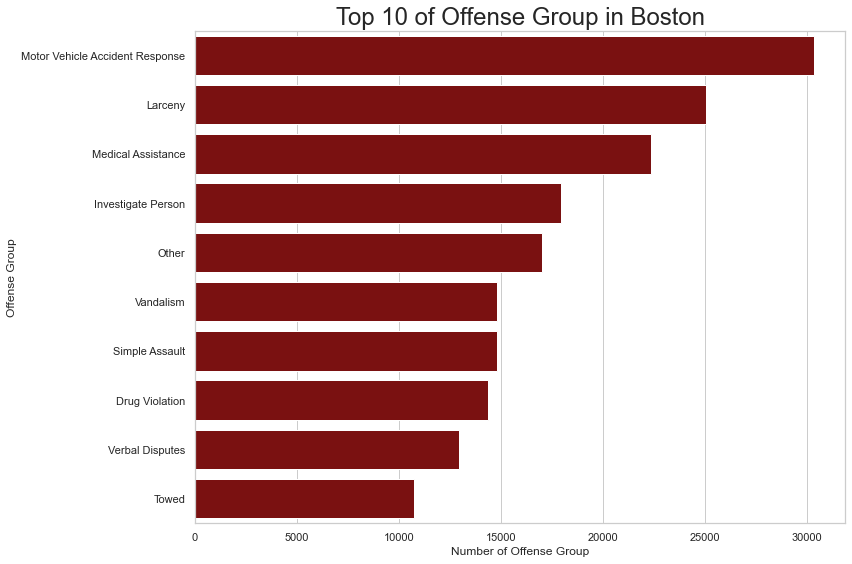

In [72]:
plt.figure(figsize=(12,8))
sns.countplot(
    data=df,
    y='Group',
    order=df['Group'].value_counts().iloc[:10].index,
    color = 'darkred'
)
plt.xlabel('Number of Offense Group', size=12)
plt.ylabel('Offense Group', size=12)
plt.title('Top 10 of Offense Group in Boston', size=24)
plt.tight_layout()
plt.show()

## Insight
- Berdasarkan top ten dari offense group, di urutan pertama ada offense group 'motor vehicle accident response' yaitu jenis pelanggaran traffic violations yang berjumlah 37132.
- Sedangkan di urutan ke sepuluh, yaitu ada pada group pelanggaran 'Towed' yang berjumlah 11287

In [73]:
# Menampilkan data group pelanggaran sering terjadi di district mana
dfGroupDistrict = df.groupby('Group')[['District']].agg(pd.Series.mode).head(50)
dfGroupDistrict 

,District
Group,
Aggravated Assault,B2
Aircraft,A7
Arson,B2
Assembly or Gathering Violations,B2
Auto Theft,B2
Auto Theft Recovery,B2
Ballistics,B2
Biological Threat,A1
Bomb Hoax,B2


In [74]:
# Menampilkan data group pelanggaran motor vehicle accident response di district B2 (district yang seringnya terjadi pelanggaran tersebut)
df_MVAR_B2 = df[(df['Group']=='Motor Vehicle Accident Response') & (df['District']=='B2')]
df_MVAR_B2

,Incident Number,Offense Code,Group,Description,District,Shooting,Date,Year,Month,Day,Hour,UCR Part,Street,Latitude,Longitude,Location,loc_info,District Name
90642,I172103933,3801,Motor Vehicle Accident Response,M/V ACCIDENT - OTHER,B2,N,2017-12-16 11:44:00,2017,12,Saturday,11,Part Three,COLUMBIA RD,42.315780,-71.066399,"(42.31578000, -71.06639900)",BBBB,Roxbury
174089,I172035013,3801,Motor Vehicle Accident Response,M/V ACCIDENT - OTHER,B2,N,2017-05-04 15:37:00,2017,5,Thursday,15,Part Three,COLUMBIA RD,42.304661,-71.081876,"(42.30466099, -71.08187569)",BBBB,Roxbury
39604,I182038280,3801,Motor Vehicle Accident Response,M/V ACCIDENT - OTHER,B2,N,2018-05-19 23:13:00,2018,5,Saturday,23,Part Three,CEYLON ST,42.310823,-71.072670,"(42.31082341, -71.07267019)",BBBB,Roxbury
66971,I182015752,3801,Motor Vehicle Accident Response,M/V ACCIDENT - OTHER,B2,N,2018-02-28 19:36:00,2018,2,Wednesday,19,Part Three,COLUMBIA RD,42.305435,-71.080578,"(42.30543493, -71.08057791)",BBBB,Roxbury
156856,I172049526,3801,Motor Vehicle Accident Response,M/V ACCIDENT - OTHER,B2,N,2017-06-20 21:57:00,2017,6,Tuesday,21,Part Three,NEW WHITNEY ST,42.333518,-71.110717,"(42.33351843, -71.11071719)",BBBB,Roxbury
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19478,I182054681,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,B2,N,2018-07-11 21:11:00,2018,7,Wednesday,21,Part Three,HOMESTEAD ST,42.311277,-71.089093,"(42.31127726, -71.08909334)",BBBB,Roxbury
349113,I152104572,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,B2,N,2015-12-19 03:55:00,2015,12,Saturday,3,Part Three,CEDAR ST,42.326969,-71.093292,"(42.32696928, -71.09329249)",BBBB,Roxbury
19494,I182054668,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,B2,N,2018-06-26 00:00:00,2018,6,Tuesday,0,Part Three,COLUMBIA RD,42.303506,-71.084560,"(42.30350569, -71.08455991)",BBBB,Roxbury
141038,I172062523,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,B2,N,2017-07-28 09:30:00,2017,7,Friday,9,Part Three,HUMPHREYS ST,42.319864,-71.066006,"(42.31986423, -71.06600589)",BBBB,Roxbury


In [75]:
# peta
MVAR_B2_map = folium.Map(location=[42.360839, -71.058826], zoom_start=11)


for index, val in df_MVAR_B2.iterrows():

    # buat marker 
    MVAR_B2_pin = folium.Marker(
        location = [val['Latitude'], val['Longitude']],
        popup = folium.Popup(f"Street: {val['Street']}",
                            min_width=250,
                            max_width=250),
        tooltip = f"Offense Group : {val['Group']}",
        icon = folium.Icon(color='black', icon_color='white', icon='home')
    ) 

    # memasukkan MVAR_B2_pin pada MVAR_B2_map
    MVAR_B2_pin.add_to(MVAR_B2_map)

MVAR_B2_map

Tooltip hitam di peta menunjukkan titik dimana terjadinya offense group 'motor vehicle accident response' yang terjadi di district B2.


Pembagian waktu menurut [sumber](https://www.britannica.com/dictionary/eb/qa/parts-of-the-day-early-morning-late-morning-etc)
Parts of the Day

**Morning**     5 am to 12 pm (noon)

Early morning    5 to 8 am
Late morning     11 am to 12pm
 

**Afternoon**     12 pm to 5 pm

Early afternoon   1 to 3pm
Late afternoon    4 to 5pm
 

**Evening**     5 pm to 9 pm

Early evening   5 to 7 pm

**Night**         9 pm to 4 am

In [76]:
# Membagi waktu ke dalam kategeori di atas
def hour_part(x):
    if x<12:
        return 'Morning'
    elif x<17:
        return 'Afternoon'
    elif x<21:
        return 'Evening'
    else:
        return 'Night'
df_MVAR_B2['Hour']=df_MVAR_B2['Hour'].apply(hour_part)

C:\Users\M70.DESKTOP-HPG2EEQ\AppData\Local\Temp\ipykernel_10864\1409352461.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_MVAR_B2['Hour']=df_MVAR_B2['Hour'].apply(hour_part)


In [77]:
# Cek Jumlah kasus yang termasuk grup pelanggaran 'motor vehicle accident group' di district B2 berdasarkan kategori jam
dfjam=pd.crosstab(index=df_MVAR_B2['Hour'],columns='Jumlah_Kasus').sort_values('Jumlah_Kasus',ascending=False)
dfjam['%']=(pd.crosstab(index=df_MVAR_B2['Hour'],columns='Jumlah_Kasus',normalize=True)*100).round(2)

dfjam

col_0,Jumlah_Kasus,%
Hour,,
Morning,1784,35.89
Afternoon,1360,27.36
Evening,1156,23.25
Night,671,13.50


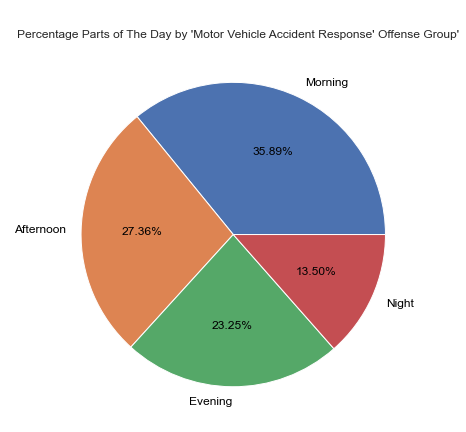

In [78]:
plt.figure(figsize=(14,7))
plt.pie(dfjam['%'],labels=dfjam.index,
    textprops={
        'size':12,
        'color':'black'
    },
    autopct='%1.2f%%'
)

plt.title("\n\n   Percentage Parts of The Day by 'Motor Vehicle Accident Response' Offense Group'")

plt.show()

Offense group 'motor vehicle accident response' di district B2 sering terjadi pada pagi hari sekitar jam 5 AM-12 PM. Sedangkan jarang terjadi pada waktu malam hari sekitar jam 9 PM-4 AM

## Insight
Berdasarkan top ten of offense group, tindakan polisi dalam mengatasi kriminalitas yang sering dilakukan adalah 'Motor Vehicle Accident Response/Penanganan Kecelakaan Kendaraan Bermotor' yaitu berjumlah 37.132. Motor Vehicle Accident Response termasuk ke dalam UCR Part III, yaitu termasuk ke dalam kategori insiden kriminal traffic violations/pelanggaran lalu lintas. Grup pelanggaran 'motor vehicle accident response' yang berjumlah paling banyak diantara grup pelanggaran lainnya ini sering sekali terjadi di district B2 pada waktu pagi hari yaitu di sekitar jam 5 AM-12 PM.

**Apa UCR part yang sering terjadi di berbagai district?**



In [79]:
# Mengubah tipe data dari kolom UCR Part dari object menjadi category agar bisa diurutkan hue nya
df['UCR Part']=df['UCR Part'].astype('category')

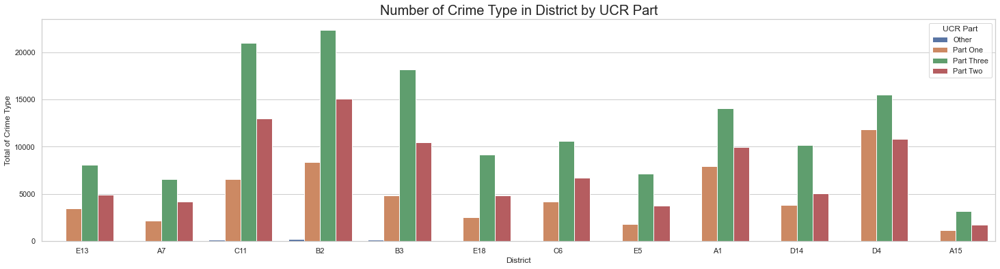

In [80]:
plt.figure(figsize=(25,6))
sns.countplot(data=df, x='District', hue='UCR Part')

plt.title('Number of Crime Type in District by UCR Part', size=20)
plt.ylabel('Total of Crime Type', size=12)
plt.show()

## Insight
- Di district E13 paling sering terjadi insiden kriminal dari UCR part 3 dan paling sedikit UCR part 1
- Di district A7 paling sering terjadi insiden kriminal dari UCR part 3 dan paling sedikit UCR part 1
- Di district C11 paling sering terjadi insiden kriminal dari UCR part 3 dan paling sedikit UCR part 1
- Di district B2 paling sering terjadi insiden kriminal dari UCR part 3 dan paling sedikit UCR part 1
- Di district B3 paling sering terjadi insiden kriminal dari UCR part 3 dan paling sedikit UCR part 1
- Di district E18 paling sering terjadi insiden kriminal dari UCR part 3 dan paling sedikit UCR part 1
- Di district C6 paling sering terjadi insiden kriminal dari UCR part 3 dan paling sedikit UCR part 1
- Di district E5 paling sering terjadi insiden kriminal dari UCR part 3 dan paling sedikit UCR part 1
- Di district A1 paling sering terjadi insiden kriminal dari UCR part 3 dan paling sedikit UCR part 1
- Di district D14 paling sering terjadi insiden kriminal dari UCR part 3 dan paling sedikit UCR part 1
- Di district D4 paling sering terjadi insiden kriminal dari UCR part 3 dan paling sedikit UCR part 2
- Di district A15 paling sering terjadi insiden kriminal dari UCR part 3 dan paling sedikit UCR part 1

**Apa jenis insiden kriminal berdasarkan UCR part yang paling sering terjadi?**

In [81]:
# Top 10 Insiden Kriminal tertinggi berdasarkan kategori UCR Part one
UCR_one=pd.crosstab(index=[df['UCR Part']=='Part One',df['Description']],columns='Jumlah_Kasus').sort_values('Jumlah_Kasus',ascending=False)
UCR_one.drop(False,inplace=True) # simpan hanya value True
UCR_one=UCR_one.droplevel(0) # jadikan single index
UCR_one['Crime Type']=UCR_one.index # buat kolom sesuai tipe kriminalitas
pindah_kolom=UCR_one.pop('Crime Type') # pindahkan ke index pertama
UCR_one.insert(0,'Crime Type',pindah_kolom)
UCR_one=UCR_one.reset_index() # buat kolom index baru untuk ranking
UCR_one.drop('Description',axis=1,inplace=True) # buang kolom tipe kriminal yang sudah diduplikasi
UCR_one['%']=(UCR_one['Jumlah_Kasus']*100/UCR_one['Jumlah_Kasus'].sum()).round(2) # tampilkan persentase dari tiap tipe kriminalitas
UCR_one.head(10)

C:\Users\M70.DESKTOP-HPG2EEQ\AppData\Local\Temp\ipykernel_10864\4204901234.py:3: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  UCR_one.drop(False,inplace=True) # simpan hanya value True


col_0,Crime Type,Jumlah_Kasus,%
0,LARCENY THEFT FROM BUILDING,8864,15.08
1,LARCENY THEFT FROM MV - NON-ACCESSORY,8361,14.22
2,LARCENY SHOPLIFTING,7781,13.23
3,LARCENY ALL OTHERS,5654,9.62
4,ASSAULT - AGGRAVATED - BATTERY,4509,7.67
5,AUTO THEFT,3338,5.68
6,ROBBERY - STREET,2699,4.59
7,ASSAULT - AGGRAVATED,2695,4.58
8,BURGLARY - RESIDENTIAL - FORCE,2577,4.38
9,BURGLARY - RESIDENTIAL - NO FORCE,2339,3.98


Berdasarkan top 10 UCR part 1 bahwa LARCENY THEFT FROM BUILDING/PENCURIAN DARI GEDUNG paling sering terjadi dengan total 8864 kasus.

In [82]:
# Top 10 Insiden Kriminal tertinggi berdasarkan kategori UCR Part two
UCR_two=pd.crosstab(index=[df['UCR Part']=='Part Two',df['Description']],columns='Jumlah_Kasus').sort_values('Jumlah_Kasus',ascending=False)
UCR_two.drop(False,inplace=True) # simpan hanya value True
UCR_two=UCR_two.droplevel(0) # jadikan single index
UCR_two['Crime Type']=UCR_two.index # buat kolom sesuai tipe kriminalitas
pindah_kolom=UCR_two.pop('Crime Type') # pindahkan ke index pertama
UCR_two.insert(0,'Crime Type',pindah_kolom)
UCR_two=UCR_two.reset_index() # buat kolom index baru untuk ranking
UCR_two.drop('Description',axis=1,inplace=True) # buang kolom tipe kriminal yang sudah diduplikasi
UCR_two['%']=(UCR_two['Jumlah_Kasus']*100/UCR_two['Jumlah_Kasus'].sum()).round(2) # tampilkan persentase dari tiap tipe kriminalitas
UCR_two.head(10)

C:\Users\M70.DESKTOP-HPG2EEQ\AppData\Local\Temp\ipykernel_10864\3858032387.py:3: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  UCR_two.drop(False,inplace=True) # simpan hanya value True


col_0,Crime Type,Jumlah_Kasus,%
0,VANDALISM,14588,16.12
1,ASSAULT SIMPLE - BATTERY,13855,15.31
2,THREATS TO DO BODILY HARM,8783,9.70
3,FRAUD - FALSE PRETENSE / SCHEME,4301,4.75
4,HARASSMENT,3945,4.36
5,TRESPASSING,3095,3.42
6,FRAUD - CREDIT CARD / ATM FRAUD,3072,3.39
7,VAL - VIOLATION OF AUTO LAW - OTHER,2467,2.73
8,"DRUGS - POSS CLASS B - COCAINE, ETC.",2154,2.38
9,VAL - OPERATING AFTER REV/SUSP.,2098,2.32


Berdasarkan top 10 UCR part 2 bahwa VANDALISM/PERUSAKAN paling sering terjadi dengan total 14588 kasus.

In [83]:
# Top 10 Insiden Kriminal tertinggi berdasarkan kategori UCR Part three
UCR_three=pd.crosstab(index=[df['UCR Part']=='Part Three',df['Description']],columns='Jumlah_Kasus').sort_values('Jumlah_Kasus',ascending=False)
UCR_three.drop(False,inplace=True) # simpan hanya value True
UCR_three=UCR_three.droplevel(0) # jadikan single index
UCR_three['Crime Type']=UCR_three.index # buat kolom sesuai tipe kriminalitas
pindah_kolom=UCR_three.pop('Crime Type') # pindahkan ke index pertama
UCR_three.insert(0,'Crime Type',pindah_kolom)
UCR_three=UCR_three.reset_index() # buat kolom index baru untuk ranking
UCR_three.drop('Description',axis=1,inplace=True) # buang kolom tipe kriminal yang sudah diduplikasi
UCR_three['%']=(UCR_three['Jumlah_Kasus']*100/UCR_three['Jumlah_Kasus'].sum()).round(2) # tampilkan persentase dari tiap tipe kriminalitas
UCR_three.head(10)

C:\Users\M70.DESKTOP-HPG2EEQ\AppData\Local\Temp\ipykernel_10864\2449835028.py:3: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  UCR_three.drop(False,inplace=True) # simpan hanya value True


col_0,Crime Type,Jumlah_Kasus,%
0,INVESTIGATE PERSON,17963,12.30
1,SICK/INJURED/MEDICAL - PERSON,17810,12.20
2,M/V - LEAVING SCENE - PROPERTY DAMAGE,14364,9.84
3,VERBAL DISPUTE,12942,8.86
4,TOWED MOTOR VEHICLE,10736,7.35
5,INVESTIGATE PROPERTY,10584,7.25
6,PROPERTY - LOST,8468,5.80
7,WARRANT ARREST,7505,5.14
8,M/V ACCIDENT - PROPERTY DAMAGE,5291,3.62
9,MISSING PERSON - LOCATED,4289,2.94


Berdasarkan top 10 UCR part 3 bahwa INVESTIGATE PERSON/MENYELIDIKI ORANG paling sering terjadi dengan total 17963 kasus.

## Insight
-  Insiden kriminal yang paling banyak dilaporkan dari UCR part one meliputi pencurian dari gedung sebanyak 8.864 kasus, pencurian dari MV - Non aksesories sebanyak 8.361 kasus, pencurian penguntilan sebanyak 7.781 kasus, pencurian dari semuanya sebanyak 5.654 kasus.
- Insiden kriminal berdasarkan UCR Part two yang paling banyak terjadi meliputi vandalisme (perbuatan merusak hasil karya seni / barang berharga) sebanyak 14.588 kasus dan serangan sebanyak 13855 kasus. Selanjutnya, ada ancaman secara fisik sebanyak 8.783 kasus, penipuan 4.301 kasus.
- Insiden kriminal yang paling banyak dilaporkan dari UCR Part three adalah kegiatan investigasi terhadap individu sebanyak 17.963 kasus, pemberian tindakan medis untuk individu yang terluka dari sebuah insiden kriminal sebanyak 17.810 kasus, perbuatan merusak harta benda dan kabur dengan kendaraan bermotor sebanyak 14.364 kasus, adu mulut sebanyak 12.942 kasus, tilang terhadap kendaraan bermotor sebanyak 10736 kasus dan kegiatan investigasi terhadap harta benda sebanyak 10.584 kasus.
- Berdasarkan UCR part I, II, dan III bahwa insiden kriminal yang sering terjadi adalah investigasi terhadap individu sebanyak 17.963 kasus dan juga pemberian tindakan medis untuk individu yang terluka dari sebuah insiden kriminal sebanyak 17.810 kasus

**Berapa persen perbandingan antara kasus insiden kriminal dengan adanya penembakan dan tidak ada penembakan?**


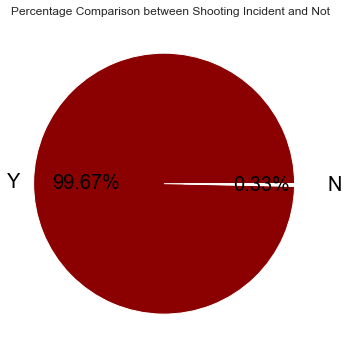

In [84]:
plt.figure(figsize=(18,6))
plt.pie(df['Shooting'].value_counts(),labels=df['Shooting'].unique(),
    colors=['darkred','white'],
    textprops={
        'size':20,
        'color':'black'},
    autopct='%1.2f%%',
    explode=(0.05,0.1))
plt.title('Percentage Comparison between Shooting Incident and Not')
plt.show()

## Insight
Kolom shooting terdiri dari value 'Y' yang menyatakan insiden kriminal yang dicatat disertai terjadinya penembakan, persentasenya sebesar 99.67% sedangkan yang diberikan value 'N' yaitu yang tidak disertai penembakan berpresentase 0.33%


**Bagaimana perubahan trend kriminalitas dari waktu ke waktu?**

Berdasarkan data klinis yang dikumpulkan oleh National Confidential Inquiry into Suicide and Safety in Mental Health (NCISH), Pelanggaran/tindak kriminal lebih mungkin terjadi pada akhir pekan, sebagian besar pada hari Sabtu [sumber: Jurnal "Do homicide rates increase during weekends and national holidays?",2019](https://www.researchgate.net/publication/332279464_Do_homicide_rates_increase_during_weekends_and_national_holidays)

Untuk itu saya akan mencoba uji hipotesis dengan one sample z-test dengan hipotesis :
- Ho : persentase tindakan kriminal yang terjadi pada weekend = 0.28 (2/7 (jumlah weekend/jumlah hari))
- Ha : persentase tindakan kriminal yang terjadi pada weekend != 0.28 (2/7 (jumlah weekend/jumlah hari))

In [85]:
case = df.groupby('Day')[['Incident Number']].agg(pd.Series.count).reset_index().iloc[[1,5,6,4,0,2,3]]
case

,Day,Incident Number
1,Monday,42463
5,Tuesday,42970
6,Wednesday,43429
4,Thursday,43268
0,Friday,45112
2,Saturday,41564
3,Sunday,37679


In [86]:
list= ['no','no','no','no','no','yes','yes']
case['dayYN'] = list
totalday = case.groupby('dayYN').sum().reset_index()
totalday

,dayYN,Incident Number
0,no,217242
1,yes,79243


keterangan :
NO = weekday
YES = Weekend

In [87]:
# total hari
n_day = len(df['Day'])
n_day

296485

In [88]:
# total weekend
totalday.loc[1,'Incident Number']

79243

In [89]:
stat, pvalue = proportions_ztest(
    count= totalday.loc[1,'Incident Number'], 
    nobs = n_day, 
    value = 0.28
)

pvalue

2.9689318061383294e-55

In [90]:
if pvalue > 0.05:
    print(f'''
    pvalue ={pvalue}, pvalue > 0.05, gagal menolak Ho')
    kita tidak punya cukup bukti untuk mengatakan bahwa persentase tindakan kriminal yang terjadi pada weekend tidak sama dengan 0.28
    (proporsi tidak berbeda signifikan)
    ''')
else:
    print(f'''
    pvalue ={pvalue}, pvalue < 0.05, berhasil menolak Ho')
    kita punya cukup bukti untuk mengatakan bahwa persentase tindakan kriminal yang terjadi pada weekend tidak sama dengan 0.28
    (proporsi berbeda signifikan)''')


    pvalue =2.9689318061383294e-55, pvalue < 0.05, berhasil menolak Ho')
    kita punya cukup bukti untuk mengatakan bahwa persentase tindakan kriminal yang terjadi pada weekend tidak sama dengan 0.28
    (proporsi berbeda signifikan)


## Insight
Berdasarkan hasil uji one sample z-test dapat diambil kesimpulan bahwa tindakan kriminal sering terjadi di weekday dibandingkan di weekend

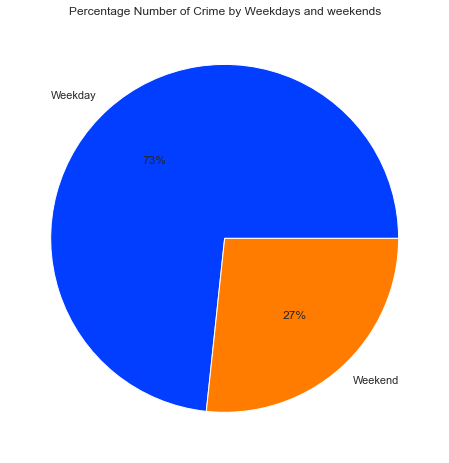

In [91]:
data = [233921,85129]
labels = ['Weekday','Weekend']

colors=sns.color_palette('bright')
textprops={
        'size':22,
        'color':'black'}

plt.figure(figsize=(8,8))
plt.pie(data, labels=labels, colors=colors, autopct='%.0f%%')
plt.title('Percentage Number of Crime by Weekdays and weekends')
plt.show()

## Insight
Persentase tindakan kriminal yang terjadi pada weekend tidak lebih banyak dibandingkan weekday, dibuktikan dengan Uji Hipotesis dan Pie Chart yang ditampilkan diatas. Hal ini juga dipengaruhi faktor bahwa weekend hanya berjumlah 2 hari yaitu hari sabtu dan hari minggu, sedangkan weekday terdapat 5 hari dalam seminggu.

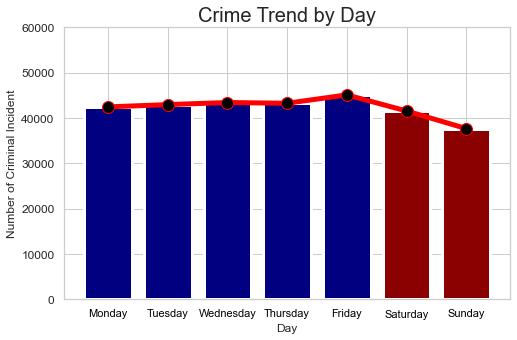

In [92]:
plt.figure(figsize=(8,5))

sns.lineplot(data= case , x='Day',y='Incident Number',linewidth=3)

sns.scatterplot(data= case , x='Day',y='Incident Number')

plt.bar(case['Day'],case['Incident Number'],
    color=('navy','navy','navy','navy','navy','darkred','darkred'),
    linewidth=3
    )

plt.plot(case['Day'],case['Incident Number'],
        color='red',
        marker='o',
        markerfacecolor='black',
        markersize=12,
        linestyle='-',
        linewidth=5)

plt.title('Crime Trend by Day',size=20)
plt.xticks(color='black')
plt.yticks(np.arange(0,60001,10000),size=12)
plt.xlabel('Day',size=12)
plt.ylabel('Number of Criminal Incident',size=12)
plt.grid(True)

plt.show()

- Rata-Rata Kriminalitas per Hari
- Jumlah Hari dalam Dataset:
- 2015 (dari 14 Juni-31 Desember) = 199 hari
- 2016 (satu tahun penuh) = 366 hari
- 2017 (satu tahun penuh) = 365 hari
- 2018 (sampai dengan 1 Januari-3 September) = 245 hari
- TOTAL = 1.175 hari




## Insight
jumlah insiden kriminal yang terjadi di hari sabtu dan hari minggu berjumlah sekitar 40.000-43.000, lebih rendah dibandingkan weekday yaitu sekitar 46.000 - 49.000 kasus

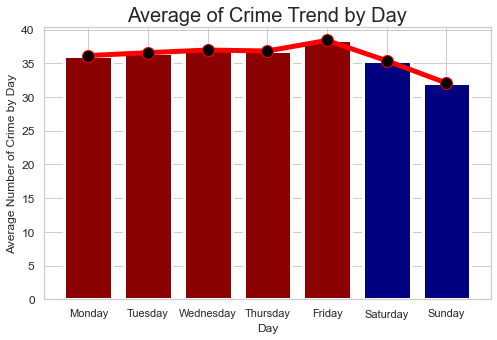

In [93]:
plt.figure(figsize=(8,5))
sns.lineplot(x=case['Day'],y=case['Incident Number']/1175,color='red',linewidth=3)

plt.bar(case['Day'],case['Incident Number']/1175,
    color=('darkred','darkred','darkred','darkred','darkred','navy','navy'),
    linewidth=3
    )

plt.plot(case['Day'],case['Incident Number']/1175,
        color='red',
        marker='o',
        markerfacecolor='black',
        markersize=12,
        linestyle='-',
        linewidth=5)

plt.title('Average of Crime Trend by Day',size=20)
plt.yticks(size=12)
plt.xlabel('Day',size=12)
plt.ylabel('Average Number of Crime by Day',size=12)
plt.grid(True)

plt.show()

## Insight
berdasarkan hari per minggu, rata-rata kriminalitas paling sering terjadi di hari jumat dan paling sedikit di hari minggu.  Di hari senin jumlahnya lebih sedikit dibandingkan hari weekday lainnya. Rata-rata terjadi 39-42 kasus per hari saat weekday dan 32-35 kasus per hari saat weekend

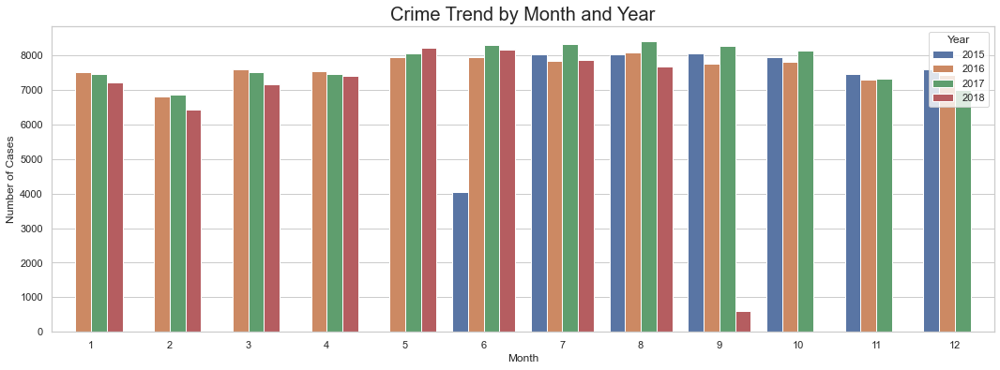

In [94]:
plt.figure(figsize=(18,6))
sns.countplot(data=df, x='Month', hue='Year')
plt.ylabel('Number of Cases',size=12)
plt.title('Crime Trend by Month and Year', size=20)
plt.show()

## Insight:
- Tingkat kriminalitas di Amerika Serikat diperingkatkan berdasarkan jumlah kasus per 100.000 orang, dengan jumlah kasus di kota Boston yang berada di rentang sekitar 40 kasus per hari, ini berarti dalam satu tahun kira-kira terjadi 14.600 kasus kriminal (365 hari x 40 kasus per hari). Jumlah kasus tersebut dibagi dengan populasi kota Boston yaitu 675,647 orang sesuai data United States census records and Population Estimates Program data. Ini berarti bahwa tingkat kriminalitas per 100.000 orang di kota Boston ada di angka 2.161 (populasi dikali dengan 100.000/populasi), mendekati angka yang dilansir FBI pada tahun 2011 dengan total 2.484 kasus FBI. Jika dibandingkan dengan 9 kota metropolitan terbesar lainnya di Amerika Serikat, kota Boston termasuk dalam peringkat 9 dengan tingkat kriminalitas tertinggi

# Rekomendasi:
1. Sistem pencatatan bedasarkan incident number diharapkan lebih rapi lagi. 1 Incident number diharapkan dapat mewakili satu pelaporan dengan offense group yang berbeda.
2. Tidak ada perbedaan signifikan antara tingkat kriminalitas per harinya, sehingga diharapkan untuk kepolisian Boston Police Department membuat program yang direncanakan yang sama untuk di setiap harinya, tanpa perlu adanya patroli khusus di hari-hari tertentu.
3. Selama periode 15 Juni 2015-3 September 2018, angka kriminalitas di kota Boston cenderung stabil. Namun hal tersebut bisa juga karena upaya yang diterapkan oleh Boston Police Department belum efektif untuk menekan turunnya angka kriminalitas di kota Boston. Maka dari itu, direkomendasikan untuk melakukan upaya tambahan sesuai konstitusi negara Amerika Serikat maupun negara bagian Massachusetts.
4. Direkomendasikan agar penanganan kriminalitas dilakukan tanpa campur tangan senjata api sehingga membuat masyarakat nyaman karena tindakan polisi yang sebelumnya cenderung terlihat represif terhadap pelaku kejahatan yang dapat terlihat dari adanya penanganan kriminalitas dengan penembakan sebesar 99.67%.
5. Distrik B2 merupakan distrik dengan tingkat kriminalitas tertinggi dibandingkan dengan 11 distrik lainnya di Boston. Sehingga diharapkan polisi Boston harus mengerahkan lebih banyak polisi untuk berpatroli dan menjaga distrik ini. Di Distrik B2 sering terjadi kelompok kejahatan 'respon kecelakaan kendaraan bermotor' pada pagi hari sekitar pukul 5 pagi hingga 12 siang. Diharapkan pihak kepolisian memasang CCTV untuk memantau arus lalu lintas di titik rawan pelanggaran lalu lintas ini. Boston memiliki teknologi untuk menata ulang jalanannya. Di jalan pintar, kami menggunakan teknologi - seperti kamera dan sensor - untuk mempelajari lebih lanjut tentang bagaimana orang menavigasi dan berinteraksi di jalan-jalan kota. Pekerjaan terbaru kami berfokus pada keselamatan jalan raya. Namun untuk kamera tilang elektronik seperti lampu merah dan kamera kecepatan, masih ilegal di Boston. Diharapkan tilang elektronik ini dapat dipertimbangkan oleh pihak kepolisian untuk diajukan sebagai hal yang legal kepada pemerintah.
6. Tindakan kepolisian yang paling banyak dilakukan selama periode waktu 15 Juni 2015-3 September 2018 adalah investigasi, baik kepada orang maupun harta benda. Maka kepolisian Boston dapat menambahkan jumlah staff di divisi investigasi, agar apabila ada banyak kasus, kepolisian tidak kekurangan staff. kemudian yang terbanyak kedua adalah tindakan kepolisian berupa bantuan medis kepada individu di tempat kejadian perkara, maka diharapkan polisi memiliki skill pemberian pertolongan pertama yang dapat dilakukan di TKP sambil menunggu petugas medis tiba. Kepolisian Boston dapat mengadakan program pelatihan pertolongan pertama seperti DRSABC, yaitu kepanjangan dari Danger, Response, Shout, Airway, Breathing, Circulation.  


In [95]:
# save untuk tableau
df.to_csv('crime_in_boston_beami.csv')